# LSTM 전력 수요 예측 

### 목차

In [19]:
"""
1. 모듈 임포트

2. 데이터 합본 저장
    -3년치 데이터
    -4년치 데이터

3. 그래프 확인
    -각 연도별 csv 데이터 로드
    -plt 그래프 함수
    -2013
    -2014
    -2015
    -2013-2015

4. 데이터 정규화 
    -Min-Max Scaling 이용, 4년치 학습 데이터 정규화

5. 데이터 연관성 분석

6. 이상치 처리
    -이상치 확인 함수 생성
    -분위별 이상치 1차 검색
    -이상치 치환
    -처리 후 잔여 개수 확인

7. 데이터셋 편집

8. 딥러닝 모델

9. 결과 표시
    -그래프 표시
    -그래프 비교 결과
    -성능 측정 지표

10. 예측값과 실제값 결과 csv 파일 저장
    -1년 단위 저장
    -1달 단위 저장
    -일주일 단위 저장
"""

'\n1. 모듈 임포트\n\n2. 데이터 합본 저장\n    -3년치 데이터\n    -4년치 데이터\n\n3. 그래프 확인\n    -각 연도별 csv 데이터 로드\n    -plt 그래프 함수\n    -2013\n    -2014\n    -2015\n    -2013-2015\n\n4. 데이터 정규화 \n    -Min-Max Scaling 이용, 4년치 학습 데이터 정규화\n\n5. 데이터 연관성 분석\n\n6. 이상치 처리\n    -이상치 확인 함수 생성\n    -분위별 이상치 1차 검색\n    -이상치 치환\n    -처리 후 잔여 개수 확인\n\n7. 데이터셋 편집\n\n8. 딥러닝 모델\n\n9. 결과 표시\n    -그래프 표시\n    -그래프 비교 결과\n    -성능 측정 지표\n\n10. 예측값과 실제값 결과 csv 파일 저장\n    -1년 단위 저장\n    -1달 단위 저장\n    -일주일 단위 저장\n'

### <화면 가로 확장>

In [20]:
# 화면 가로 확장 코드 (기본 width 50%)
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:80% !important; }</style>"))

### 1. 모듈 임포트

In [21]:
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import seaborn as sns
import tensorflow as tf
import csv
import os
import datetime

### <GPU 확인>

In [22]:
tf.test.gpu_device_name()

'/device:GPU:0'

### 2. 데이터 합본 저장

#### 3년치 데이터

In [23]:
df_3Y = pd.DataFrame()
for y in range(2013, 2016):
    file = './Combined_Data/'+str(y)+'_'+'House1_Ch1_Combined_Data_Y.csv'
    df_y= pd.read_csv(file, encoding='cp949')
    df_3Y = pd.concat([df_3Y, df_y])
    
df_3Y = df_3Y.drop([df_3Y.columns[0]], axis=1)
df_3Y = df_3Y.reset_index(drop=True)
df_3Y.to_csv("./Combined_Data/House1_Ch1_Combined_Data_13-15.csv", encoding='cp949')

In [24]:
Data_3Y = pd.read_csv('./Combined_Data/House1_Ch1_Combined_Data_13-15.csv', encoding='cp949')
Data_3Y.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 26280 entries, 0 to 26279
Data columns (total 9 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Unnamed: 0  26280 non-null  int64  
 1   DateTime    26280 non-null  int64  
 2   Graph_Date  26280 non-null  object 
 3   Day         26280 non-null  object 
 4   Holiday     26280 non-null  int64  
 5   Seq         26280 non-null  int64  
 6   Watt        26280 non-null  int64  
 7   Temp        26280 non-null  float64
 8   CPI         26280 non-null  float64
dtypes: float64(2), int64(5), object(2)
memory usage: 1.8+ MB


#### 4년치 데이터

In [25]:
df_4Y = pd.DataFrame()
for y in range(2013, 2017):
    file = './Combined_Data/'+str(y)+'_'+'House1_Ch1_Combined_Data_Y.csv'
    df_y= pd.read_csv(file, encoding='cp949')
    df_4Y = pd.concat([df_4Y, df_y])
    
df_4Y = df_4Y.drop([df_4Y.columns[0]], axis=1)
df_4Y = df_4Y.reset_index(drop=True)
df_4Y.to_csv("./Combined_Data/House1_Ch1_Combined_Data_13-16.csv", encoding='cp949')

In [26]:
Data_4Y = pd.read_csv('./Combined_Data/House1_Ch1_Combined_Data_13-16.csv', encoding='cp949')
Data_4Y.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35040 entries, 0 to 35039
Data columns (total 9 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Unnamed: 0  35040 non-null  int64  
 1   DateTime    35040 non-null  int64  
 2   Graph_Date  35040 non-null  object 
 3   Day         35040 non-null  object 
 4   Holiday     35040 non-null  int64  
 5   Seq         35040 non-null  int64  
 6   Watt        35040 non-null  int64  
 7   Temp        35040 non-null  float64
 8   CPI         35040 non-null  float64
dtypes: float64(2), int64(5), object(2)
memory usage: 2.4+ MB


### 3. 그래프 확인

#### 각 연도별 csv 데이터 로드

In [27]:
Data_2013=pd.read_csv('./Combined_Data/2013_House1_Ch1_Combined_Data_Y.csv', encoding='cp949')
Data_2014=pd.read_csv('./Combined_Data/2014_House1_Ch1_Combined_Data_Y.csv', encoding='cp949')
Data_2015=pd.read_csv('./Combined_Data/2015_House1_Ch1_Combined_Data_Y.csv', encoding='cp949')
Data_2016=pd.read_csv('./Combined_Data/2016_House1_Ch1_Combined_Data_Y.csv', encoding='cp949')

#### Plt 그래프 함수

In [28]:
def Graph(name1, name2, year):
    font_head = {'color': 'w', 'weight': 'bold', 'size': 20}
    font_body = {'color': 'w', 'weight': 'bold', 'size': 15}

    # 1번째 그래프
    ax1 = plt.subplot(2, 1, 1)
    ax1.spines['left'].set_color('yellow')
    ax1.spines['left'].set_lw(2)
    ax1.spines['bottom'].set_color('yellow')
    ax1.spines['bottom'].set_lw(2)

    ax1.tick_params(axis='x', colors='white', size=10)
    ax1.tick_params(axis='x', colors='white', labelsize=15)
    ax1.tick_params(axis='y', colors='white', size=10)
    ax1.tick_params(axis='y', colors='white', labelsize=15)

    plt.plot(x, y1, '.-', color='y', linewidth=1)
    plt.title(name1, fontdict=font_head, pad=20)
    plt.xticks(visible=False)
    plt.ylabel('Watt',labelpad=15, fontdict=font_body)

    # 2번째 그래프
    ax2 = plt.subplot(2, 1, 2, sharex=ax1)
    ax2.spines['left'].set_color('blue')
    ax2.spines['left'].set_lw(2)
    ax2.spines['bottom'].set_color('blue')
    ax2.spines['bottom'].set_lw(2)

    ax2.tick_params(axis='x', colors='white', size=10)
    ax2.tick_params(axis='x', colors='white', labelsize=15)
    ax2.tick_params(axis='y', colors='white', size=10)
    ax2.tick_params(axis='y', colors='white', labelsize=15)

    plt.plot(x, y2, '.-', color='b', linewidth=1)
    plt.title(name2, fontdict=font_head, pad=20)
    plt.xlabel('Time',labelpad=15, fontdict=font_body)
    plt.ylabel('Temp',labelpad=15, fontdict=font_body)
    plt.margins(x=0.02)
    
    if year==1:
        plt.xticks([0, 31, 59, 90, 120, 151, 181, 212, 243, 273, 304, 334], labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
    if year==3:
        plt.xticks([0, 365, 730], labels=['2013', '2014', '2015'])

    #plt.tight_layout()
    plt.show()

#### 1년치 그래프 확인

#### 2013

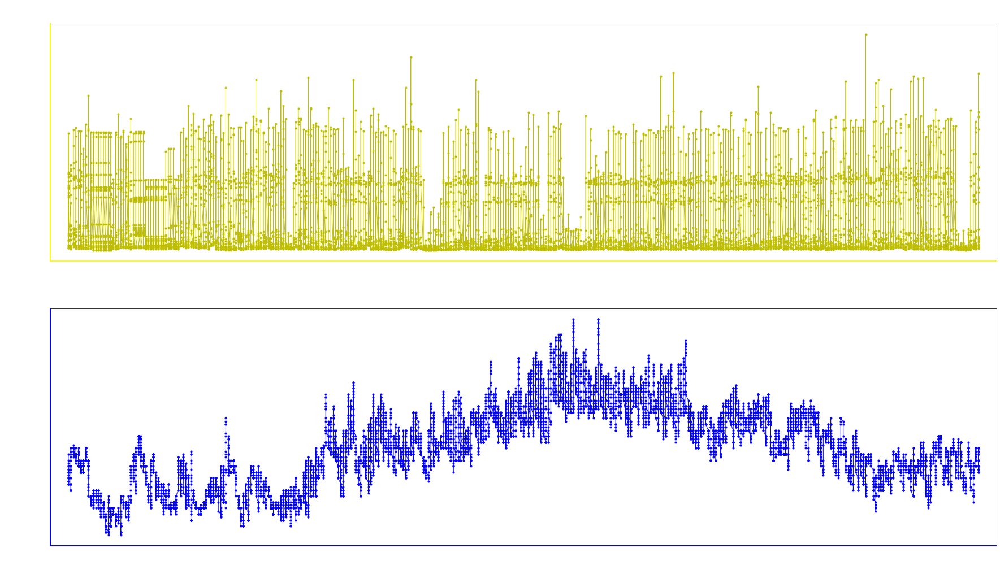

In [29]:
x = Data_2013['Graph_Date']
y1 = Data_2013['Watt']
y2 = Data_2013['Temp']

plt.figure(figsize=(30,17))

Graph("2013's Time-Watt Graph", "2013's Time-Temp Graph", 1)

#### 2014

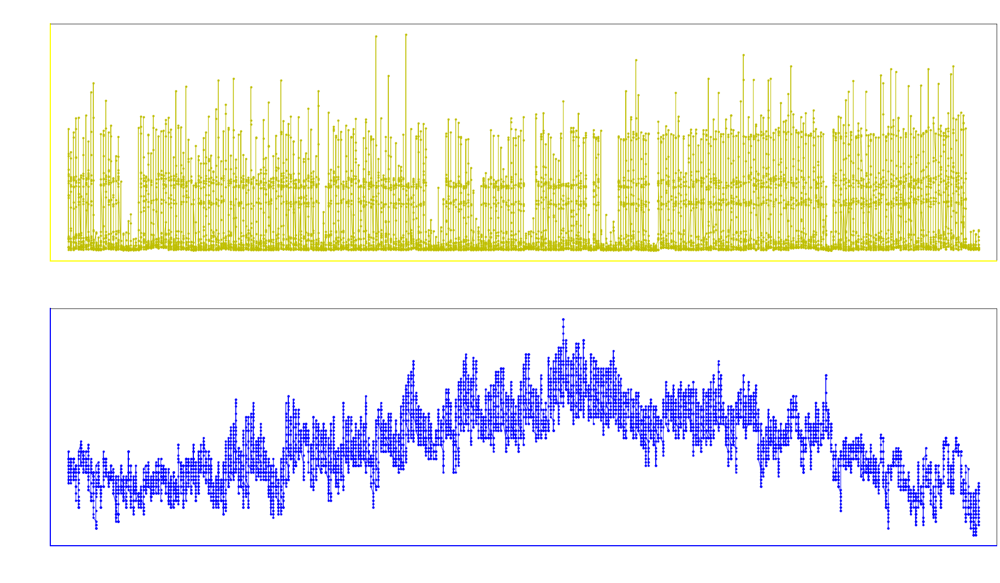

In [30]:
x = Data_2014['Graph_Date']
y1 = Data_2014['Watt']
y2 = Data_2014['Temp']

plt.figure(figsize=(30,17))

Graph("2014's Time-Watt Graph", "2014's Time-Temp Graph", 1)

#### 2015

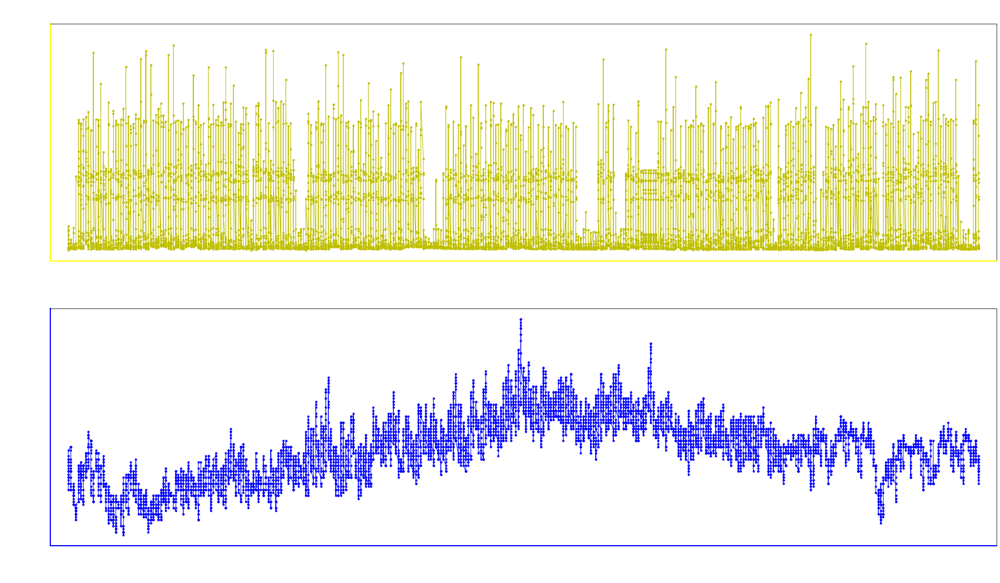

In [31]:
x = Data_2015['Graph_Date']
y1 = Data_2015['Watt']
y2 = Data_2015['Temp']

plt.figure(figsize=(30,17))

Graph("2015's Time-Watt Graph", "2015's Time-Temp Graph", 1)

#### 3년치 데이터 그래프 확인

#### 2013-2015

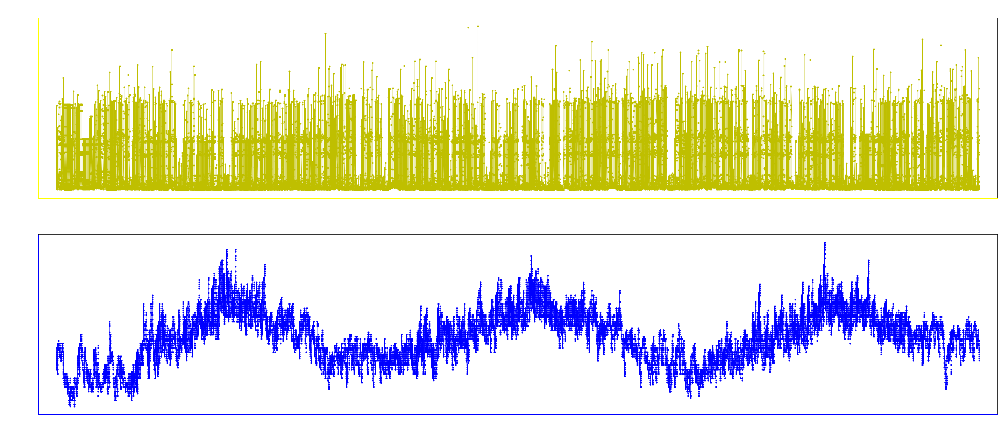

In [32]:
x = Data_3Y['Graph_Date']
y1 = Data_3Y['Watt']
y2 = Data_3Y['Temp']

plt.figure(figsize=(40,17))

Graph("13-15's Time-Watt Graph","13-15's Time-Temp Graph", 3)

### 4. 데이터 정규화

#### Min-Max Scaling 이용, 4년치 학습 데이터 정규화

In [65]:
from sklearn.preprocessing import MinMaxScaler

# 정규화 과정을 거쳐 데이터 범위를 원하는 범위로 제한. 그래프는 동일하나 손실 정도를 확인하기에 더 좋음.
#배치 정규화는 기울기 소멸 문제를 해결하기는 좋으나, RNN의 경우 계층별로 미니 정규화 적용이 필요해 모델이 복잡해지고 효율이 저하됨.
Data_4Y.sort_index(ascending=False).reset_index(drop=True)

scaler = MinMaxScaler()
scale_cols = ['Holiday', 'Watt', 'Temp', 'CPI']
Data_4Y_scaled = scaler.fit_transform(Data_4Y[scale_cols])
Data_4Y_scaled = pd.DataFrame(Data_4Y_scaled)
Data_4Y_scaled.columns = scale_cols

Data_4Y_scaled.insert(0, 'DateTime', Data_4Y['DateTime'])
Data_4Y_scaled.insert(1, 'Graph_Date', Data_4Y['Graph_Date'])
Data_4Y_scaled

,DateTime,Graph_Date,Holiday,Watt,Temp,CPI
0,20130101,2013-01-01,1.0,0.270038,0.360000,0.933333
1,20130101,2013-01-01,1.0,0.268530,0.333333,0.933333
2,20130101,2013-01-01,1.0,0.263775,0.320000,0.933333
3,20130101,2013-01-01,1.0,0.011368,0.306667,0.933333
4,20130101,2013-01-01,1.0,0.010788,0.306667,0.933333
...,...,...,...,...,...,...
35035,20161231,2016-12-31,1.0,0.024707,0.333333,0.566667
35036,20161231,2016-12-31,1.0,0.182809,0.333333,0.566667
35037,20161231,2016-12-31,1.0,0.089781,0.306667,0.566667
35038,20161231,2016-12-31,1.0,0.049878,0.306667,0.566667


### 5. 데이터 연관성 분석

In [66]:
import scipy.stats as stats

# 피어슨 stat을 이용하면 피어슨 상관계수와 p-value값이 출력되는데 상관계수는 양 or 음의 비례관계 정도를, p-value는 상관 정도를 보여준다. (0에 가까울수록 영향이 크다.)

Correlation=stats.pearsonr(Data_4Y_scaled['Holiday'], Data_4Y_scaled['Watt'])
print('< Holiday - Watt >')
print('P-value ==>> %.3f\n' %Correlation[1])

Correlation=stats.pearsonr(Data_4Y_scaled['Temp'], Data_4Y_scaled['Watt'])
print('< Temp - Watt >')
print('P-value ==>> %.3f\n' %Correlation[1])

Correlation=stats.pearsonr(Data_4Y_scaled['CPI'], Data_4Y_scaled['Watt'])
print('< CPI - Watt >')
print('P-value ==>> %.3f\n' %Correlation[1])

< Holiday - Watt >
P-value ==>> 0.000

< Temp - Watt >
P-value ==>> 0.169

< CPI - Watt >
P-value ==>> 0.000



### 6. 이상치 처리

#### 이상치 확인 함수 생성

In [67]:
def get_outlier(df=None, column=None, weight=1.5):
    quantile_25 = np.percentile(df[column].values, 25)
    quantile_50 = np.percentile(df[column].values, 50)
    quantile_75 = np.percentile(df[column].values, 75)
    
    IQR = quantile_75 - quantile_25
    IQR_weight = IQR * weight
    
    lowest_val = quantile_25-IQR_weight
    highest_val = quantile_75+IQR_weight
    
    outlier_index_low = df[column][df[column] < lowest_val].index
    outlier_index_high = df[column][df[column] > highest_val].index
    
    return outlier_index_low, outlier_index_high, quantile_25, quantile_50, quantile_75

#### 분위별 이상치 1차 검색

In [68]:
print('Low Outlier ==>> {}\n'.format(get_outlier(df=Data_4Y_scaled, column='Watt', weight=1.5)[0]))
print('High Outlier ==>> {}\n'.format(get_outlier(df=Data_4Y_scaled, column='Watt', weight=1.5)[1]))

print('25% Value ==>> {}\n'.format(get_outlier(df=Data_4Y_scaled, column='Watt', weight=1.5)[2]))
print('50% Value ==>> {}\n'.format(get_outlier(df=Data_4Y_scaled, column='Watt', weight=1.5)[3]))
print('75% Value ==>> {}'.format(get_outlier(df=Data_4Y_scaled, column='Watt', weight=1.5)[4]))

Low Outlier ==>> Int64Index([], dtype='int64')

High Outlier ==>> Int64Index([  199,  1159,  1519,  1813,  1938,  2057,  2084,  2225,  2321,
             2341,
            ...
            33225, 33537, 33761, 34063, 34193, 34309, 34429, 34906, 34907,
            35025],
           dtype='int64', length=230)

25% Value ==>> 0.014499478018791326

50% Value ==>> 0.03932258438696207

75% Value ==>> 0.24834705950585778


#### 이상치 치환

In [69]:
high_val = get_outlier(df=Data_4Y_scaled, column='Watt', weight=1.5)[1].values.tolist()

for l in range(len(high_val)):
    Data_4Y_scaled['Watt'][high_val[l]] = get_outlier(df=Data_4Y_scaled, column='Watt', weight=1.5)[4]

C:\Users\ADMINI~1\AppData\Local\Temp/ipykernel_9320/1588975600.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Data_4Y_scaled['Watt'][high_val[l]] = get_outlier(df=Data_4Y_scaled, column='Watt', weight=1.5)[4]


#### 이상치 처리 후 잔여 개수 확인

In [70]:
print('Quantity of Low Outlier ==>> {}\n'.format(len(get_outlier(df=Data_4Y_scaled, column='Watt', weight=1.5)[0])))
print('Quantity of High Outlier ==>> {}\n'.format(len(get_outlier(df=Data_4Y_scaled, column='Watt', weight=1.5)[1])))

Quantity of Low Outlier ==>> 0

Quantity of High Outlier ==>> 0



### 7. 데이터셋 편집

In [71]:
TEST_SIZE = 8761 # 1년치를 테스트셋으로 사용
WINDOW_SIZE = 1 # 얼마 동안의 과거 기반의 데이터에 기반하여 다음날의 값을 예측할 것인지 설정. 1=1시간을 의미

train = Data_4Y_scaled[:-TEST_SIZE]
test= Data_4Y_scaled[-TEST_SIZE:]

In [72]:
def make_dataset(data, label, window_size=1):
    feature_list = []
    label_list = []
    for i in range(len(data) - window_size):
        feature_list.append(np.array(data.iloc[i:i+window_size]))
        label_list.append(np.array(label.iloc[i+window_size]))
    return np.array(feature_list), np.array(label_list)

In [73]:
from sklearn.model_selection import train_test_split

feature_cols = ['Holiday', 'Watt', 'Temp', 'CPI']
label_cols = ['Watt']

train_feature = train[feature_cols]
train_label = train[label_cols]

train_feature, train_label = make_dataset(train_feature, train_label, 1)# 여기서도 일자 설정

x_train, x_valid, y_train, y_valid = train_test_split(train_feature, train_label, test_size=0.2, shuffle=False)

In [74]:
print(' x_train >> {0}\n x_valid >> {1}\n y_train >> {2}\n y_valid >> {3}'.format(x_train.shape, x_valid.shape, y_train.shape, y_valid.shape))

 x_train >> (21004, 24, 4)
 x_valid >> (5251, 24, 4)
 y_train >> (21004, 1)
 y_valid >> (5251, 1)


In [75]:
x_test = test[feature_cols]
y_test = test[label_cols]

In [76]:
x_test, y_test = make_dataset(x_test, y_test, 1)
x_test.shape, y_test.shape

((8737, 24, 4), (8737, 1))

### 8. 딥러닝 모델

In [77]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras.layers import LSTM
from tensorflow.keras.layers import Bidirectional
from keras.layers import TimeDistributed
import keras

tf.debugging.set_log_device_placement(True)

with tf.device('/GPU:0'):
    model = Sequential()
    model.add(LSTM(256, activation='ReLU', input_shape=(train_feature.shape[1], train_feature.shape[2]), return_sequences=True))
    model.add(Bidirectional(LSTM(128, activation='ReLU', return_sequences=True), merge_mode='concat'))
    model.add(LSTM(128, activation='ReLU', return_sequences = True))
    model.add(Bidirectional(LSTM(64, activation='ReLU', return_sequences=True), merge_mode='concat'))
    model.add(LSTM(64, activation='ReLU', return_sequences = True))
    model.add(Bidirectional(LSTM(32, activation='ReLU', return_sequences=True), merge_mode='concat'))
    model.add(TimeDistributed(Dense(32)))
    model.add(LSTM(32, activation='ReLU', return_sequences = False))
    model.add(Dense(1, activation = 'sigmoid'))
    model.summary()

Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op RandomUniform in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Sub in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mul in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AddV2 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:

Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op RandomUniform in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Sub in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mul in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AddV2 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op RandomStandardNormal in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mul in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AddV2 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Qr in device /job:localhost/replica:0/task

Executing op Sub in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mul in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AddV2 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op RandomStandardNormal in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mul in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AddV2 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Qr in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op DiagPart in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Sign in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mul in device /job:localhost/replica:0/task:0/device:GPU:0
Executing

Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op RandomUniform in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Sub in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mul in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AddV2 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op RandomStandardNormal in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mul in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AddV2 in device /job:localhost/repli

In [78]:
import os

# 시간 표시, 측정용
now = datetime.datetime.now() # 현재 시각
TimeNow = now.strftime('%Y-%m-%d  %H:%M:%S') # 시작 시각 표시용.

with tf.device('/GPU:0'):
    print('Start Time >>', TimeNow, '\n')
    now = datetime.datetime.now()
    start = now

    model.compile(loss='mean_squared_error', optimizer='Nadam', metrics=['mse'])
    early_stop = EarlyStopping(monitor='val_loss', patience=7)

    model_path = 'model'
    filename = os.path.join(model_path, 'tmp_checkpoint.h5')
    checkpoint = ModelCheckpoint(filename, monitor='val_loss', verbose=1, save_best_only=True, mode='auto')
    history = model.fit(x_train, y_train, epochs=35, batch_size=32,validation_data=(x_valid, y_valid), callbacks=[early_stop, checkpoint])

    now = datetime.datetime.now()
    end = now
    elapsed_time = end-start
    elapsed_time = str(elapsed_time).split(".")
    elapsed_time = elapsed_time[0]
    print('소요시간 >> ', elapsed_time)

Start Time >> 2022-02-21  16:47:06 

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Ex

Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/rep

Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/rep

Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/rep

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
 20/657 [..............................] - ETA: 7:30 - loss: 0.0708 - mse: 0.0708Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
 21/657 [..............................] - ETA: 7:35 - loss: 0.0687 - mse: 0.0687Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
 22/657 [>.............................] - ETA: 7:39 - loss: 0.0664 - mse: 0.0664Executing op ReadVariableOp in device /job:localhost/repl

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
 44/657 [=>............................] - ETA: 7:27 - loss: 0.0457 - mse: 0.0457Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
 45/657 [=>............................] - ETA: 7:25 - loss: 0.0453 - mse: 0.0453Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
 46/657 [=>............................] - ETA: 7:23 - loss: 0.0448 - mse: 0.0448Executing op ReadVariableOp in device /job:localhost/repl

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
 68/657 [==>...........................] - ETA: 7:06 - loss: 0.0378 - mse: 0.0378Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
 69/657 [==>...........................] - ETA: 7:04 - loss: 0.0376 - mse: 0.0376Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
 70/657 [==>...........................] - ETA: 7:03 - loss: 0.0373 - mse: 0.0373Executing op ReadVariableOp in device /job:localhost/repl

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
 92/657 [===>..........................] - ETA: 6:50 - loss: 0.0337 - mse: 0.0337Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
 93/657 [===>..........................] - ETA: 6:50 - loss: 0.0336 - mse: 0.0336Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
 94/657 [===>..........................] - ETA: 6:50 - loss: 0.0335 - mse: 0.0335Executing op ReadVariableOp in device /job:localhost/repl

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
116/657 [====>.........................] - ETA: 6:33 - loss: 0.0315 - mse: 0.0315Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
117/657 [====>.........................] - ETA: 6:32 - loss: 0.0315 - mse: 0.0315Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
118/657 [====>.........................] - ETA: 6:31 - loss: 0.0314 - mse: 0.0314Executing op ReadVariableOp in device /job:localhost/repl

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
140/657 [=====>........................] - ETA: 6:14 - loss: 0.0300 - mse: 0.0300Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
141/657 [=====>........................] - ETA: 6:13 - loss: 0.0299 - mse: 0.0299Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
142/657 [=====>........................] - ETA: 6:13 - loss: 0.0298 - mse: 0.0298Executing op ReadVariableOp in device /job:localhost/repl

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
164/657 [======>.......................] - ETA: 5:54 - loss: 0.0289 - mse: 0.0289Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
165/657 [======>.......................] - ETA: 5:54 - loss: 0.0288 - mse: 0.0288Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
166/657 [======>.......................] - ETA: 5:53 - loss: 0.0288 - mse: 0.0288Executing op ReadVariableOp in device /job:localhost/repl

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
188/657 [=======>......................] - ETA: 5:36 - loss: 0.0278 - mse: 0.0278Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
189/657 [=======>......................] - ETA: 5:35 - loss: 0.0278 - mse: 0.0278Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
190/657 [=======>......................] - ETA: 5:34 - loss: 0.0277 - mse: 0.0277Executing op ReadVariableOp in device /job:localhost/repl

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
212/657 [========>.....................] - ETA: 5:17 - loss: 0.0269 - mse: 0.0269Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
213/657 [========>.....................] - ETA: 5:16 - loss: 0.0269 - mse: 0.0269Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
214/657 [========>.....................] - ETA: 5:15 - loss: 0.0268 - mse: 0.0268Executing op ReadVariableOp in device /job:localhost/repl

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
236/657 [=========>....................] - ETA: 4:57 - loss: 0.0263 - mse: 0.0263Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
237/657 [=========>....................] - ETA: 4:56 - loss: 0.0263 - mse: 0.0263Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
238/657 [=========>....................] - ETA: 4:55 - loss: 0.0263 - mse: 0.0263Executing op ReadVariableOp in device /job:localhost/repl

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
260/657 [==========>...................] - ETA: 4:38 - loss: 0.0255 - mse: 0.0255Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
261/657 [==========>...................] - ETA: 4:37 - loss: 0.0255 - mse: 0.0255Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
262/657 [==========>...................] - ETA: 4:37 - loss: 0.0255 - mse: 0.0255Executing op ReadVariableOp in device /job:localhost/repl

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
284/657 [===========>..................] - ETA: 4:20 - loss: 0.0250 - mse: 0.0250Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
285/657 [============>.................] - ETA: 4:20 - loss: 0.0250 - mse: 0.0250Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
286/657 [============>.................] - ETA: 4:19 - loss: 0.0250 - mse: 0.0250Executing op ReadVariableOp in device /job:localhost/repl

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
308/657 [=============>................] - ETA: 4:03 - loss: 0.0247 - mse: 0.0247Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
309/657 [=============>................] - ETA: 4:02 - loss: 0.0247 - mse: 0.0247Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
310/657 [=============>................] - ETA: 4:01 - loss: 0.0247 - mse: 0.0247Executing op ReadVariableOp in device /job:localhost/repl

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
332/657 [==============>...............] - ETA: 3:45 - loss: 0.0242 - mse: 0.0242Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
333/657 [==============>...............] - ETA: 3:44 - loss: 0.0241 - mse: 0.0241Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
334/657 [==============>...............] - ETA: 3:43 - loss: 0.0241 - mse: 0.0241Executing op ReadVariableOp in device /job:localhost/repl

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
356/657 [===============>..............] - ETA: 3:27 - loss: 0.0238 - mse: 0.0238Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
357/657 [===============>..............] - ETA: 3:27 - loss: 0.0238 - mse: 0.0238Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
358/657 [===============>..............] - ETA: 3:26 - loss: 0.0238 - mse: 0.0238Executing op ReadVariableOp in device /job:localhost/repl

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
380/657 [================>.............] - ETA: 3:10 - loss: 0.0235 - mse: 0.0235Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
381/657 [================>.............] - ETA: 3:09 - loss: 0.0235 - mse: 0.0235Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
382/657 [================>.............] - ETA: 3:09 - loss: 0.0235 - mse: 0.0235Executing op ReadVariableOp in device /job:localhost/repl

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
404/657 [=================>............] - ETA: 2:54 - loss: 0.0234 - mse: 0.0234Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
405/657 [=================>............] - ETA: 2:53 - loss: 0.0234 - mse: 0.0234Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
406/657 [=================>............] - ETA: 2:53 - loss: 0.0234 - mse: 0.0234Executing op ReadVariableOp in device /job:localhost/repl

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
428/657 [==================>...........] - ETA: 2:38 - loss: 0.0232 - mse: 0.0232Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
429/657 [==================>...........] - ETA: 2:37 - loss: 0.0232 - mse: 0.0232Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
430/657 [==================>...........] - ETA: 2:36 - loss: 0.0232 - mse: 0.0232Executing op ReadVariableOp in device /job:localhost/repl

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
452/657 [===================>..........] - ETA: 2:22 - loss: 0.0230 - mse: 0.0230Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
453/657 [===================>..........] - ETA: 2:21 - loss: 0.0230 - mse: 0.0230Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
454/657 [===================>..........] - ETA: 2:20 - loss: 0.0230 - mse: 0.0230Executing op ReadVariableOp in device /job:localhost/repl

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
476/657 [====================>.........] - ETA: 2:05 - loss: 0.0228 - mse: 0.0228Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
477/657 [====================>.........] - ETA: 2:05 - loss: 0.0228 - mse: 0.0228Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
478/657 [====================>.........] - ETA: 2:04 - loss: 0.0228 - mse: 0.0228Executing op ReadVariableOp in device /job:localhost/repl

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
500/657 [=====================>........] - ETA: 1:49 - loss: 0.0226 - mse: 0.0226Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
501/657 [=====================>........] - ETA: 1:48 - loss: 0.0226 - mse: 0.0226Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
502/657 [=====================>........] - ETA: 1:47 - loss: 0.0226 - mse: 0.0226Executing op ReadVariableOp in device /job:localhost/repl

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
524/657 [======================>.......] - ETA: 1:32 - loss: 0.0224 - mse: 0.0224Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
525/657 [======================>.......] - ETA: 1:31 - loss: 0.0224 - mse: 0.0224Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
526/657 [=======================>......] - ETA: 1:31 - loss: 0.0224 - mse: 0.0224Executing op ReadVariableOp in device /job:localhost/repl

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
548/657 [========================>.....] - ETA: 1:16 - loss: 0.0224 - mse: 0.0224Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
549/657 [========================>.....] - ETA: 1:15 - loss: 0.0224 - mse: 0.0224Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
550/657 [========================>.....] - ETA: 1:14 - loss: 0.0224 - mse: 0.0224Executing op ReadVariableOp in device /job:localhost/repl

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
572/657 [=========================>....] - ETA: 59s - loss: 0.0224 - mse: 0.0224 Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
573/657 [=========================>....] - ETA: 58s - loss: 0.0224 - mse: 0.0224Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
574/657 [=========================>....] - ETA: 58s - loss: 0.0224 - mse: 0.0224Executing op ReadVariableOp in device /job:localhost/replic

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
596/657 [==========================>...] - ETA: 42s - loss: 0.0222 - mse: 0.0222Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
597/657 [==========================>...] - ETA: 42s - loss: 0.0222 - mse: 0.0222Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
598/657 [==========================>...] - ETA: 41s - loss: 0.0222 - mse: 0.0222Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica

620/657 [===========================>..] - ETA: 25s - loss: 0.0221 - mse: 0.0221Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
621/657 [===========================>..] - ETA: 25s - loss: 0.0221 - mse: 0.0221Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
622/657 [===========================>..] - ETA: 24s - loss: 0.0221 - mse: 0.0221Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /

Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /

Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0

Epoch 00001: val_loss improved from inf to 0.01987, saving model to model\tmp_checkpoint.h5
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loca

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
 18/657 [..............................] - ETA: 7:56 - loss: 0.0202 - mse: 0.0202Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
 19/657 [..............................] - ETA: 7:54 - loss: 0.0203 - mse: 0.0203Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
 20/657 [..............................] - ETA: 7:51 - loss: 0.0203 - mse: 0.0203Executing op ReadVariableOp in device /job:localhost/repl

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
 42/657 [>.............................] - ETA: 7:11 - loss: 0.0193 - mse: 0.0193Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
 43/657 [>.............................] - ETA: 7:09 - loss: 0.0193 - mse: 0.0193Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
 44/657 [=>............................] - ETA: 7:08 - loss: 0.0193 - mse: 0.0193Executing op ReadVariableOp in device /job:localhost/repl

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
 66/657 [==>...........................] - ETA: 6:56 - loss: 0.0197 - mse: 0.0197Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
 67/657 [==>...........................] - ETA: 6:55 - loss: 0.0196 - mse: 0.0196Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
 68/657 [==>...........................] - ETA: 6:54 - loss: 0.0196 - mse: 0.0196Executing op ReadVariableOp in device /job:localhost/repl

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
 90/657 [===>..........................] - ETA: 6:40 - loss: 0.0195 - mse: 0.0195Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
 91/657 [===>..........................] - ETA: 6:40 - loss: 0.0195 - mse: 0.0195Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
 92/657 [===>..........................] - ETA: 6:39 - loss: 0.0195 - mse: 0.0195Executing op ReadVariableOp in device /job:localhost/repl

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
114/657 [====>.........................] - ETA: 6:23 - loss: 0.0193 - mse: 0.0193Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
115/657 [====>.........................] - ETA: 6:22 - loss: 0.0193 - mse: 0.0193Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
116/657 [====>.........................] - ETA: 6:21 - loss: 0.0192 - mse: 0.0192Executing op ReadVariableOp in device /job:localhost/repl

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
138/657 [=====>........................] - ETA: 6:06 - loss: 0.0191 - mse: 0.0191Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
139/657 [=====>........................] - ETA: 6:05 - loss: 0.0191 - mse: 0.0191Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
140/657 [=====>........................] - ETA: 6:04 - loss: 0.0190 - mse: 0.0190Executing op ReadVariableOp in device /job:localhost/repl

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
162/657 [======>.......................] - ETA: 5:48 - loss: 0.0189 - mse: 0.0189Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
163/657 [======>.......................] - ETA: 5:47 - loss: 0.0189 - mse: 0.0189Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
164/657 [======>.......................] - ETA: 5:47 - loss: 0.0189 - mse: 0.0189Executing op ReadVariableOp in device /job:localhost/repl

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
186/657 [=======>......................] - ETA: 5:32 - loss: 0.0192 - mse: 0.0192Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
187/657 [=======>......................] - ETA: 5:31 - loss: 0.0192 - mse: 0.0192Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
188/657 [=======>......................] - ETA: 5:30 - loss: 0.0192 - mse: 0.0192Executing op ReadVariableOp in device /job:localhost/repl

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
210/657 [========>.....................] - ETA: 5:14 - loss: 0.0190 - mse: 0.0190Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
211/657 [========>.....................] - ETA: 5:13 - loss: 0.0190 - mse: 0.0190Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
212/657 [========>.....................] - ETA: 5:13 - loss: 0.0190 - mse: 0.0190Executing op ReadVariableOp in device /job:localhost/repl

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
234/657 [=========>....................] - ETA: 4:59 - loss: 0.0189 - mse: 0.0189Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
235/657 [=========>....................] - ETA: 4:58 - loss: 0.0189 - mse: 0.0189Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
236/657 [=========>....................] - ETA: 4:57 - loss: 0.0189 - mse: 0.0189Executing op ReadVariableOp in device /job:localhost/repl

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
258/657 [==========>...................] - ETA: 4:41 - loss: 0.0188 - mse: 0.0188Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
259/657 [==========>...................] - ETA: 4:41 - loss: 0.0189 - mse: 0.0189Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
260/657 [==========>...................] - ETA: 4:40 - loss: 0.0188 - mse: 0.0188Executing op ReadVariableOp in device /job:localhost/repl

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
282/657 [===========>..................] - ETA: 4:23 - loss: 0.0188 - mse: 0.0188Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
283/657 [===========>..................] - ETA: 4:22 - loss: 0.0188 - mse: 0.0188Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
284/657 [===========>..................] - ETA: 4:21 - loss: 0.0189 - mse: 0.0189Executing op ReadVariableOp in device /job:localhost/repl

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
306/657 [============>.................] - ETA: 4:06 - loss: 0.0189 - mse: 0.0189Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
307/657 [=============>................] - ETA: 4:06 - loss: 0.0189 - mse: 0.0189Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
308/657 [=============>................] - ETA: 4:05 - loss: 0.0189 - mse: 0.0189Executing op ReadVariableOp in device /job:localhost/repl

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
330/657 [==============>...............] - ETA: 3:50 - loss: 0.0190 - mse: 0.0190Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
331/657 [==============>...............] - ETA: 3:50 - loss: 0.0190 - mse: 0.0190Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
332/657 [==============>...............] - ETA: 3:49 - loss: 0.0190 - mse: 0.0190Executing op ReadVariableOp in device /job:localhost/repl

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
354/657 [===============>..............] - ETA: 3:33 - loss: 0.0190 - mse: 0.0190Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
355/657 [===============>..............] - ETA: 3:33 - loss: 0.0190 - mse: 0.0190Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
356/657 [===============>..............] - ETA: 3:32 - loss: 0.0190 - mse: 0.0190Executing op ReadVariableOp in device /job:localhost/repl

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
378/657 [================>.............] - ETA: 3:16 - loss: 0.0191 - mse: 0.0191Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
379/657 [================>.............] - ETA: 3:15 - loss: 0.0191 - mse: 0.0191Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
380/657 [================>.............] - ETA: 3:15 - loss: 0.0191 - mse: 0.0191Executing op ReadVariableOp in device /job:localhost/repl

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
402/657 [=================>............] - ETA: 2:59 - loss: 0.0191 - mse: 0.0191Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
403/657 [=================>............] - ETA: 2:58 - loss: 0.0191 - mse: 0.0191Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
404/657 [=================>............] - ETA: 2:58 - loss: 0.0191 - mse: 0.0191Executing op ReadVariableOp in device /job:localhost/repl

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
426/657 [==================>...........] - ETA: 2:42 - loss: 0.0190 - mse: 0.0190Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
427/657 [==================>...........] - ETA: 2:41 - loss: 0.0190 - mse: 0.0190Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
428/657 [==================>...........] - ETA: 2:41 - loss: 0.0189 - mse: 0.0189Executing op ReadVariableOp in device /job:localhost/repl

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
450/657 [===================>..........] - ETA: 2:25 - loss: 0.0190 - mse: 0.0190Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
451/657 [===================>..........] - ETA: 2:24 - loss: 0.0190 - mse: 0.0190Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
452/657 [===================>..........] - ETA: 2:24 - loss: 0.0190 - mse: 0.0190Executing op ReadVariableOp in device /job:localhost/repl

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
474/657 [====================>.........] - ETA: 2:08 - loss: 0.0189 - mse: 0.0189Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
475/657 [====================>.........] - ETA: 2:07 - loss: 0.0189 - mse: 0.0189Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
476/657 [====================>.........] - ETA: 2:06 - loss: 0.0189 - mse: 0.0189Executing op ReadVariableOp in device /job:localhost/repl

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
498/657 [=====================>........] - ETA: 1:51 - loss: 0.0190 - mse: 0.0190Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
499/657 [=====================>........] - ETA: 1:50 - loss: 0.0190 - mse: 0.0190Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
500/657 [=====================>........] - ETA: 1:50 - loss: 0.0190 - mse: 0.0190Executing op ReadVariableOp in device /job:localhost/repl

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
522/657 [======================>.......] - ETA: 1:34 - loss: 0.0190 - mse: 0.0190Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
523/657 [======================>.......] - ETA: 1:33 - loss: 0.0191 - mse: 0.0191Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
524/657 [======================>.......] - ETA: 1:33 - loss: 0.0191 - mse: 0.0191Executing op ReadVariableOp in device /job:localhost/repl

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
546/657 [=======================>......] - ETA: 1:17 - loss: 0.0190 - mse: 0.0190Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
547/657 [=======================>......] - ETA: 1:16 - loss: 0.0190 - mse: 0.0190Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
548/657 [========================>.....] - ETA: 1:16 - loss: 0.0190 - mse: 0.0190Executing op ReadVariableOp in device /job:localhost/repl

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
570/657 [=========================>....] - ETA: 1:00 - loss: 0.0190 - mse: 0.0190Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
571/657 [=========================>....] - ETA: 1:00 - loss: 0.0190 - mse: 0.0190Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
572/657 [=========================>....] - ETA: 59s - loss: 0.0190 - mse: 0.0190 Executing op ReadVariableOp in device /job:localhost/repl

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
594/657 [==========================>...] - ETA: 44s - loss: 0.0190 - mse: 0.0190Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
595/657 [==========================>...] - ETA: 43s - loss: 0.0190 - mse: 0.0190Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
596/657 [==========================>...] - ETA: 42s - loss: 0.0190 - mse: 0.0190Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica

618/657 [===========================>..] - ETA: 27s - loss: 0.0189 - mse: 0.0189Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
619/657 [===========================>..] - ETA: 26s - loss: 0.0189 - mse: 0.0189Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
620/657 [===========================>..] - ETA: 25s - loss: 0.0190 - mse: 0.0190Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /

Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /

Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /


Epoch 00002: val_loss improved from 0.01987 to 0.01875, saving model to model\tmp_checkpoint.h5
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identit

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
657/657 [==============================] - 481s 733ms/step - loss: 0.0189 - mse: 0.0189 - val_loss: 0.0187 - val_mse: 0.0187
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device

 20/657 [..............................] - ETA: 7:12 - loss: 0.0191 - mse: 0.0191Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
 21/657 [..............................] - ETA: 7:10 - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
 22/657 [>.............................] - ETA: 7:16 - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/repl

 44/657 [=>............................] - ETA: 7:16 - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
 45/657 [=>............................] - ETA: 7:15 - loss: 0.0189 - mse: 0.0189Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
 46/657 [=>............................] - ETA: 7:13 - loss: 0.0189 - mse: 0.0189Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/repl

 68/657 [==>...........................] - ETA: 7:09 - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
 69/657 [==>...........................] - ETA: 7:08 - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
 70/657 [==>...........................] - ETA: 7:08 - loss: 0.0182 - mse: 0.0182Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/repl

 92/657 [===>..........................] - ETA: 6:39 - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
 93/657 [===>..........................] - ETA: 6:38 - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
 94/657 [===>..........................] - ETA: 6:37 - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/repl

116/657 [====>.........................] - ETA: 6:16 - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
117/657 [====>.........................] - ETA: 6:16 - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
118/657 [====>.........................] - ETA: 6:15 - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/repl

140/657 [=====>........................] - ETA: 5:57 - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
141/657 [=====>........................] - ETA: 5:57 - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
142/657 [=====>........................] - ETA: 5:56 - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/repl

164/657 [======>.......................] - ETA: 5:37 - loss: 0.0180 - mse: 0.0180Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
165/657 [======>.......................] - ETA: 5:36 - loss: 0.0181 - mse: 0.0181Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
166/657 [======>.......................] - ETA: 5:35 - loss: 0.0181 - mse: 0.0181Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/repl

188/657 [=======>......................] - ETA: 5:21 - loss: 0.0181 - mse: 0.0181Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
189/657 [=======>......................] - ETA: 5:20 - loss: 0.0181 - mse: 0.0181Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
190/657 [=======>......................] - ETA: 5:19 - loss: 0.0182 - mse: 0.0182Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/repl

212/657 [========>.....................] - ETA: 5:02 - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
213/657 [========>.....................] - ETA: 5:01 - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
214/657 [========>.....................] - ETA: 5:00 - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/repl

236/657 [=========>....................] - ETA: 4:45 - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
237/657 [=========>....................] - ETA: 4:44 - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
238/657 [=========>....................] - ETA: 4:43 - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/repl

260/657 [==========>...................] - ETA: 4:28 - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
261/657 [==========>...................] - ETA: 4:27 - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
262/657 [==========>...................] - ETA: 4:26 - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/repl

284/657 [===========>..................] - ETA: 4:11 - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
285/657 [============>.................] - ETA: 4:10 - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
286/657 [============>.................] - ETA: 4:09 - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/repl

308/657 [=============>................] - ETA: 3:54 - loss: 0.0182 - mse: 0.0182Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
309/657 [=============>................] - ETA: 3:53 - loss: 0.0182 - mse: 0.0182Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
310/657 [=============>................] - ETA: 3:53 - loss: 0.0182 - mse: 0.0182Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/repl

332/657 [==============>...............] - ETA: 3:38 - loss: 0.0182 - mse: 0.0182Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
333/657 [==============>...............] - ETA: 3:37 - loss: 0.0182 - mse: 0.0182Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
334/657 [==============>...............] - ETA: 3:37 - loss: 0.0182 - mse: 0.0182Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/repl

356/657 [===============>..............] - ETA: 3:22 - loss: 0.0182 - mse: 0.0182Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
357/657 [===============>..............] - ETA: 3:21 - loss: 0.0182 - mse: 0.0182Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
358/657 [===============>..............] - ETA: 3:20 - loss: 0.0182 - mse: 0.0182Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/repl

380/657 [================>.............] - ETA: 3:05 - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
381/657 [================>.............] - ETA: 3:05 - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
382/657 [================>.............] - ETA: 3:04 - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/repl

404/657 [=================>............] - ETA: 2:49 - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
405/657 [=================>............] - ETA: 2:48 - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
406/657 [=================>............] - ETA: 2:48 - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/repl

428/657 [==================>...........] - ETA: 2:33 - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
429/657 [==================>...........] - ETA: 2:32 - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
430/657 [==================>...........] - ETA: 2:31 - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/repl

452/657 [===================>..........] - ETA: 2:17 - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
453/657 [===================>..........] - ETA: 2:16 - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
454/657 [===================>..........] - ETA: 2:15 - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/repl

476/657 [====================>.........] - ETA: 2:01 - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
477/657 [====================>.........] - ETA: 2:01 - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
478/657 [====================>.........] - ETA: 2:00 - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/repl

500/657 [=====================>........] - ETA: 1:45 - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
501/657 [=====================>........] - ETA: 1:44 - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
502/657 [=====================>........] - ETA: 1:44 - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/repl

524/657 [======================>.......] - ETA: 1:29 - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
525/657 [======================>.......] - ETA: 1:28 - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
526/657 [=======================>......] - ETA: 1:27 - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/repl

548/657 [========================>.....] - ETA: 1:13 - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
549/657 [========================>.....] - ETA: 1:12 - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
550/657 [========================>.....] - ETA: 1:11 - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/repl

572/657 [=========================>....] - ETA: 57s - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
573/657 [=========================>....] - ETA: 56s - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
574/657 [=========================>....] - ETA: 55s - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica

620/657 [===========================>..] - ETA: 24s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
621/657 [===========================>..] - ETA: 24s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
622/657 [===========================>..] - ETA: 23s - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica

Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /

Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Epoch 4/35
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
  1/657 [..............................] - ETA: 6:34 - loss: 0.0199 - mse: 0.0199Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
  2/657 [..............................] - ETA: 6:54 - loss: 0.0173 - mse: 0.0173Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
 24/657 [>.............................] - ETA: 7:04 - loss: 0.0194 - mse: 0.0194Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
 25/657 [>.............................] - ETA: 7:03 - loss: 0.0197 - mse: 0.0197Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
 26/657 [>.............................] - ETA: 7:02 - loss: 0.0196 - mse: 0.0196Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
 48/657 [=>............................] - ETA: 7:01 - loss: 0.0190 - mse: 0.0190Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
 49/657 [=>............................] - ETA: 6:59 - loss: 0.0188 - mse: 0.0188Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
 50/657 [=>............................] - ETA: 6:58 - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
 72/657 [==>...........................] - ETA: 6:40 - loss: 0.0193 - mse: 0.0193Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
 73/657 [==>...........................] - ETA: 6:39 - loss: 0.0194 - mse: 0.0194Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
 74/657 [==>...........................] - ETA: 6:39 - loss: 0.0194 - mse: 0.0194Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
 96/657 [===>..........................] - ETA: 6:20 - loss: 0.0191 - mse: 0.0191Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
 97/657 [===>..........................] - ETA: 6:21 - loss: 0.0190 - mse: 0.0190Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
 98/657 [===>..........................] - ETA: 6:20 - loss: 0.0190 - mse: 0.0190Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
120/657 [====>.........................] - ETA: 6:09 - loss: 0.0189 - mse: 0.0189Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
121/657 [====>.........................] - ETA: 6:08 - loss: 0.0189 - mse: 0.0189Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
122/657 [====>.........................] - ETA: 6:07 - loss: 0.0189 - mse: 0.0189Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
144/657 [=====>........................] - ETA: 5:57 - loss: 0.0189 - mse: 0.0189Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
145/657 [=====>........................] - ETA: 5:56 - loss: 0.0189 - mse: 0.0189Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
146/657 [=====>........................] - ETA: 5:55 - loss: 0.0190 - mse: 0.0190Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
168/657 [======>.......................] - ETA: 5:40 - loss: 0.0192 - mse: 0.0192Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
169/657 [======>.......................] - ETA: 5:39 - loss: 0.0191 - mse: 0.0191Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
170/657 [======>.......................] - ETA: 5:39 - loss: 0.0191 - mse: 0.0191Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
192/657 [=======>......................] - ETA: 5:22 - loss: 0.0192 - mse: 0.0192Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
193/657 [=======>......................] - ETA: 5:21 - loss: 0.0192 - mse: 0.0192Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
194/657 [=======>......................] - ETA: 5:20 - loss: 0.0192 - mse: 0.0192Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
216/657 [========>.....................] - ETA: 5:04 - loss: 0.0190 - mse: 0.0190Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
217/657 [========>.....................] - ETA: 5:03 - loss: 0.0191 - mse: 0.0191Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
218/657 [========>.....................] - ETA: 5:02 - loss: 0.0190 - mse: 0.0190Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
240/657 [=========>....................] - ETA: 4:48 - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
241/657 [==========>...................] - ETA: 4:47 - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
242/657 [==========>...................] - ETA: 4:47 - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
264/657 [===========>..................] - ETA: 4:32 - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
265/657 [===========>..................] - ETA: 4:32 - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
266/657 [===========>..................] - ETA: 4:31 - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
288/657 [============>.................] - ETA: 4:16 - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
289/657 [============>.................] - ETA: 4:16 - loss: 0.0188 - mse: 0.0188Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
290/657 [============>.................] - ETA: 4:15 - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
312/657 [=============>................] - ETA: 4:00 - loss: 0.0188 - mse: 0.0188Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
313/657 [=============>................] - ETA: 3:59 - loss: 0.0188 - mse: 0.0188Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
314/657 [=============>................] - ETA: 3:59 - loss: 0.0189 - mse: 0.0189Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
336/657 [==============>...............] - ETA: 3:43 - loss: 0.0188 - mse: 0.0188Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
337/657 [==============>...............] - ETA: 3:42 - loss: 0.0188 - mse: 0.0188Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
338/657 [==============>...............] - ETA: 3:42 - loss: 0.0188 - mse: 0.0188Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
360/657 [===============>..............] - ETA: 3:26 - loss: 0.0188 - mse: 0.0188Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
361/657 [===============>..............] - ETA: 3:25 - loss: 0.0188 - mse: 0.0188Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
362/657 [===============>..............] - ETA: 3:25 - loss: 0.0188 - mse: 0.0188Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
384/657 [================>.............] - ETA: 3:09 - loss: 0.0188 - mse: 0.0188Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
385/657 [================>.............] - ETA: 3:08 - loss: 0.0188 - mse: 0.0188Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
386/657 [================>.............] - ETA: 3:07 - loss: 0.0188 - mse: 0.0188Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
408/657 [=================>............] - ETA: 2:52 - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
409/657 [=================>............] - ETA: 2:51 - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
410/657 [=================>............] - ETA: 2:51 - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
432/657 [==================>...........] - ETA: 2:36 - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
433/657 [==================>...........] - ETA: 2:35 - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
434/657 [==================>...........] - ETA: 2:34 - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
456/657 [===================>..........] - ETA: 2:19 - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
457/657 [===================>..........] - ETA: 2:18 - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
458/657 [===================>..........] - ETA: 2:17 - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
480/657 [====================>.........] - ETA: 2:02 - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
481/657 [====================>.........] - ETA: 2:01 - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
482/657 [=====================>........] - ETA: 2:01 - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
504/657 [======================>.......] - ETA: 1:46 - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
505/657 [======================>.......] - ETA: 1:45 - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
506/657 [======================>.......] - ETA: 1:44 - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
528/657 [=======================>......] - ETA: 1:29 - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
529/657 [=======================>......] - ETA: 1:28 - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
530/657 [=======================>......] - ETA: 1:28 - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
552/657 [========================>.....] - ETA: 1:13 - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
553/657 [========================>.....] - ETA: 1:12 - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
554/657 [========================>.....] - ETA: 1:11 - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
576/657 [=========================>....] - ETA: 56s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
577/657 [=========================>....] - ETA: 55s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
578/657 [=========================>....] - ETA: 54s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica

600/657 [==========================>...] - ETA: 39s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
601/657 [==========================>...] - ETA: 39s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
602/657 [==========================>...] - ETA: 38s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica

648/657 [============================>.] - ETA: 6s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
649/657 [============================>.] - ETA: 5s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
650/657 [============================>.] - ETA: 4s - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /

Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /

Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
  2/657 [..............................] - ETA: 7:43 - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
  3/657 [..............................] - ETA: 7:26 - loss: 0.0155 - mse: 0.0155Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
  4/657 [..............................] - ETA: 7:22 - loss: 0.0160 - mse: 0.0160Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
 26/657 [>.............................] - ETA: 6:54 - loss: 0.0177 - mse: 0.0177Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
 27/657 [>.............................] - ETA: 6:53 - loss: 0.0179 - mse: 0.0179Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
 28/657 [>.............................] - ETA: 6:52 - loss: 0.0177 - mse: 0.0177Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
 50/657 [=>............................] - ETA: 6:46 - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
 51/657 [=>............................] - ETA: 6:47 - loss: 0.0186 - mse: 0.0186Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
 52/657 [=>............................] - ETA: 6:47 - loss: 0.0187 - mse: 0.0187Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
 74/657 [==>...........................] - ETA: 6:48 - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
 75/657 [==>...........................] - ETA: 6:49 - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
 76/657 [==>...........................] - ETA: 6:49 - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
 98/657 [===>..........................] - ETA: 6:32 - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
 99/657 [===>..........................] - ETA: 6:30 - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
100/657 [===>..........................] - ETA: 6:30 - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
122/657 [====>.........................] - ETA: 6:13 - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
123/657 [====>.........................] - ETA: 6:12 - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
124/657 [====>.........................] - ETA: 6:11 - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
146/657 [=====>........................] - ETA: 5:55 - loss: 0.0182 - mse: 0.0182Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
147/657 [=====>........................] - ETA: 5:54 - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
148/657 [=====>........................] - ETA: 5:54 - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
170/657 [======>.......................] - ETA: 5:41 - loss: 0.0181 - mse: 0.0181Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
171/657 [======>.......................] - ETA: 5:40 - loss: 0.0181 - mse: 0.0181Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
172/657 [======>.......................] - ETA: 5:40 - loss: 0.0181 - mse: 0.0181Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
194/657 [=======>......................] - ETA: 5:26 - loss: 0.0180 - mse: 0.0180Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
195/657 [=======>......................] - ETA: 5:25 - loss: 0.0180 - mse: 0.0180Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
196/657 [=======>......................] - ETA: 5:24 - loss: 0.0180 - mse: 0.0180Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
218/657 [========>.....................] - ETA: 5:07 - loss: 0.0182 - mse: 0.0182Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
219/657 [=========>....................] - ETA: 5:07 - loss: 0.0182 - mse: 0.0182Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
220/657 [=========>....................] - ETA: 5:06 - loss: 0.0182 - mse: 0.0182Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
242/657 [==========>...................] - ETA: 4:50 - loss: 0.0182 - mse: 0.0182Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
243/657 [==========>...................] - ETA: 4:50 - loss: 0.0182 - mse: 0.0182Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
244/657 [==========>...................] - ETA: 4:49 - loss: 0.0182 - mse: 0.0182Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
266/657 [===========>..................] - ETA: 4:36 - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
267/657 [===========>..................] - ETA: 4:35 - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
268/657 [===========>..................] - ETA: 4:35 - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
290/657 [============>.................] - ETA: 4:20 - loss: 0.0181 - mse: 0.0181Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
291/657 [============>.................] - ETA: 4:20 - loss: 0.0181 - mse: 0.0181Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
292/657 [============>.................] - ETA: 4:19 - loss: 0.0181 - mse: 0.0181Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
314/657 [=============>................] - ETA: 4:04 - loss: 0.0182 - mse: 0.0182Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
315/657 [=============>................] - ETA: 4:03 - loss: 0.0182 - mse: 0.0182Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
316/657 [=============>................] - ETA: 4:03 - loss: 0.0182 - mse: 0.0182Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
338/657 [==============>...............] - ETA: 3:46 - loss: 0.0182 - mse: 0.0182Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
339/657 [==============>...............] - ETA: 3:45 - loss: 0.0182 - mse: 0.0182Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
340/657 [==============>...............] - ETA: 3:45 - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
362/657 [===============>..............] - ETA: 3:29 - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
363/657 [===============>..............] - ETA: 3:28 - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
364/657 [===============>..............] - ETA: 3:27 - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
386/657 [================>.............] - ETA: 3:12 - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
387/657 [================>.............] - ETA: 3:11 - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
388/657 [================>.............] - ETA: 3:10 - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
410/657 [=================>............] - ETA: 2:54 - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
411/657 [=================>............] - ETA: 2:54 - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
412/657 [=================>............] - ETA: 2:53 - loss: 0.0183 - mse: 0.0183Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
434/657 [==================>...........] - ETA: 2:37 - loss: 0.0182 - mse: 0.0182Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
435/657 [==================>...........] - ETA: 2:36 - loss: 0.0182 - mse: 0.0182Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
436/657 [==================>...........] - ETA: 2:36 - loss: 0.0182 - mse: 0.0182Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
458/657 [===================>..........] - ETA: 2:20 - loss: 0.0182 - mse: 0.0182Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
459/657 [===================>..........] - ETA: 2:20 - loss: 0.0182 - mse: 0.0182Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
460/657 [====================>.........] - ETA: 2:19 - loss: 0.0182 - mse: 0.0182Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
482/657 [=====================>........] - ETA: 2:04 - loss: 0.0182 - mse: 0.0182Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
483/657 [=====================>........] - ETA: 2:03 - loss: 0.0182 - mse: 0.0182Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
484/657 [=====================>........] - ETA: 2:02 - loss: 0.0182 - mse: 0.0182Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
506/657 [======================>.......] - ETA: 1:47 - loss: 0.0182 - mse: 0.0182Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
507/657 [======================>.......] - ETA: 1:46 - loss: 0.0182 - mse: 0.0182Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
508/657 [======================>.......] - ETA: 1:45 - loss: 0.0182 - mse: 0.0182Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
530/657 [=======================>......] - ETA: 1:29 - loss: 0.0182 - mse: 0.0182Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
531/657 [=======================>......] - ETA: 1:29 - loss: 0.0182 - mse: 0.0182Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
532/657 [=======================>......] - ETA: 1:28 - loss: 0.0182 - mse: 0.0182Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
554/657 [========================>.....] - ETA: 1:12 - loss: 0.0184 - mse: 0.0184Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
555/657 [========================>.....] - ETA: 1:12 - loss: 0.0185 - mse: 0.0185Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
556/657 [========================>.....] - ETA: 1:11 - loss: 0.0188 - mse: 0.0188Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
578/657 [=========================>....] - ETA: 55s - loss: 0.0240 - mse: 0.0240Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
579/657 [=========================>....] - ETA: 55s - loss: 0.0240 - mse: 0.0240Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
580/657 [=========================>....] - ETA: 54s - loss: 0.0240 - mse: 0.0240Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica

602/657 [==========================>...] - ETA: 38s - loss: 0.0276 - mse: 0.0276Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
603/657 [==========================>...] - ETA: 38s - loss: 0.0277 - mse: 0.0277Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
604/657 [==========================>...] - ETA: 37s - loss: 0.0277 - mse: 0.0277Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica

650/657 [============================>.] - ETA: 4s - loss: 0.0286 - mse: 0.0286Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
651/657 [============================>.] - ETA: 4s - loss: 0.0286 - mse: 0.0286Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
652/657 [============================>.] - ETA: 3s - loss: 0.0286 - mse: 0.0286Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /

Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
  6/657 [..............................] - ETA: 7:16 - loss: 0.0406 - mse: 0.0406Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
  7/657 [..............................] - ETA: 7:17 - loss: 0.0390 - mse: 0.0390Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
  8/657 [..............................] - ETA: 7:10 - loss: 0.0382 - mse: 0.0382Executing op ReadVariableOp in device /job:localhost/repl

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
 30/657 [>.............................] - ETA: 7:02 - loss: 0.0366 - mse: 0.0366Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
 31/657 [>.............................] - ETA: 7:01 - loss: 0.0364 - mse: 0.0364Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
 32/657 [>.............................] - ETA: 6:59 - loss: 0.0369 - mse: 0.0369Executing op ReadVariableOp in device /job:localhost/repl

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
 54/657 [=>............................] - ETA: 6:48 - loss: 0.0406 - mse: 0.0406Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
 55/657 [=>............................] - ETA: 6:47 - loss: 0.0405 - mse: 0.0405Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
 56/657 [=>............................] - ETA: 6:46 - loss: 0.0403 - mse: 0.0403Executing op ReadVariableOp in device /job:localhost/repl

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
 78/657 [==>...........................] - ETA: 6:34 - loss: 0.0400 - mse: 0.0400Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
 79/657 [==>...........................] - ETA: 6:33 - loss: 0.0398 - mse: 0.0398Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
 80/657 [==>...........................] - ETA: 6:32 - loss: 0.0396 - mse: 0.0396Executing op ReadVariableOp in device /job:localhost/repl

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
102/657 [===>..........................] - ETA: 6:19 - loss: 0.0394 - mse: 0.0394Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
103/657 [===>..........................] - ETA: 6:18 - loss: 0.0395 - mse: 0.0395Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
104/657 [===>..........................] - ETA: 6:18 - loss: 0.0395 - mse: 0.0395Executing op ReadVariableOp in device /job:localhost/repl

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
126/657 [====>.........................] - ETA: 6:01 - loss: 0.0385 - mse: 0.0385Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
127/657 [====>.........................] - ETA: 6:00 - loss: 0.0384 - mse: 0.0384Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
128/657 [====>.........................] - ETA: 6:00 - loss: 0.0384 - mse: 0.0384Executing op ReadVariableOp in device /job:localhost/repl

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
150/657 [=====>........................] - ETA: 5:47 - loss: 0.0386 - mse: 0.0386Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
151/657 [=====>........................] - ETA: 5:46 - loss: 0.0386 - mse: 0.0386Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
152/657 [=====>........................] - ETA: 5:46 - loss: 0.0387 - mse: 0.0387Executing op ReadVariableOp in device /job:localhost/repl

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
174/657 [======>.......................] - ETA: 5:33 - loss: 0.0388 - mse: 0.0388Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
175/657 [======>.......................] - ETA: 5:32 - loss: 0.0388 - mse: 0.0388Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
176/657 [=======>......................] - ETA: 5:32 - loss: 0.0388 - mse: 0.0388Executing op ReadVariableOp in device /job:localhost/repl

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
198/657 [========>.....................] - ETA: 5:17 - loss: 0.0386 - mse: 0.0386Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
199/657 [========>.....................] - ETA: 5:16 - loss: 0.0385 - mse: 0.0385Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
200/657 [========>.....................] - ETA: 5:15 - loss: 0.0385 - mse: 0.0385Executing op ReadVariableOp in device /job:localhost/repl

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
222/657 [=========>....................] - ETA: 4:59 - loss: 0.0386 - mse: 0.0386Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
223/657 [=========>....................] - ETA: 4:58 - loss: 0.0385 - mse: 0.0385Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
224/657 [=========>....................] - ETA: 4:57 - loss: 0.0385 - mse: 0.0385Executing op ReadVariableOp in device /job:localhost/repl

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
246/657 [==========>...................] - ETA: 4:40 - loss: 0.0391 - mse: 0.0391Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
247/657 [==========>...................] - ETA: 4:39 - loss: 0.0390 - mse: 0.0390Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
248/657 [==========>...................] - ETA: 4:39 - loss: 0.0391 - mse: 0.0391Executing op ReadVariableOp in device /job:localhost/repl

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
270/657 [===========>..................] - ETA: 4:23 - loss: 0.0388 - mse: 0.0388Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
271/657 [===========>..................] - ETA: 4:22 - loss: 0.0388 - mse: 0.0388Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
272/657 [===========>..................] - ETA: 4:21 - loss: 0.0388 - mse: 0.0388Executing op ReadVariableOp in device /job:localhost/repl

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
294/657 [============>.................] - ETA: 4:06 - loss: 0.0386 - mse: 0.0386Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
295/657 [============>.................] - ETA: 4:05 - loss: 0.0386 - mse: 0.0386Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
296/657 [============>.................] - ETA: 4:04 - loss: 0.0386 - mse: 0.0386Executing op ReadVariableOp in device /job:localhost/repl

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
318/657 [=============>................] - ETA: 3:49 - loss: 0.0388 - mse: 0.0388Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
319/657 [=============>................] - ETA: 3:48 - loss: 0.0388 - mse: 0.0388Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
320/657 [=============>................] - ETA: 3:48 - loss: 0.0388 - mse: 0.0388Executing op ReadVariableOp in device /job:localhost/repl

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
342/657 [==============>...............] - ETA: 3:32 - loss: 0.0387 - mse: 0.0387Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
343/657 [==============>...............] - ETA: 3:32 - loss: 0.0387 - mse: 0.0387Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
344/657 [==============>...............] - ETA: 3:31 - loss: 0.0388 - mse: 0.0388Executing op ReadVariableOp in device /job:localhost/repl

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
366/657 [===============>..............] - ETA: 3:16 - loss: 0.0389 - mse: 0.0389Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
367/657 [===============>..............] - ETA: 3:15 - loss: 0.0388 - mse: 0.0388Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
368/657 [===============>..............] - ETA: 3:14 - loss: 0.0388 - mse: 0.0388Executing op ReadVariableOp in device /job:localhost/repl

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
390/657 [================>.............] - ETA: 2:59 - loss: 0.0386 - mse: 0.0386Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
391/657 [================>.............] - ETA: 2:59 - loss: 0.0385 - mse: 0.0385Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
392/657 [================>.............] - ETA: 2:58 - loss: 0.0386 - mse: 0.0386Executing op ReadVariableOp in device /job:localhost/repl

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
414/657 [=================>............] - ETA: 2:43 - loss: 0.0387 - mse: 0.0387Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
415/657 [=================>............] - ETA: 2:43 - loss: 0.0388 - mse: 0.0388Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
416/657 [=================>............] - ETA: 2:42 - loss: 0.0388 - mse: 0.0388Executing op ReadVariableOp in device /job:localhost/repl

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
438/657 [===================>..........] - ETA: 2:27 - loss: 0.0389 - mse: 0.0389Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
439/657 [===================>..........] - ETA: 2:27 - loss: 0.0389 - mse: 0.0389Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
440/657 [===================>..........] - ETA: 2:26 - loss: 0.0389 - mse: 0.0389Executing op ReadVariableOp in device /job:localhost/repl

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
462/657 [====================>.........] - ETA: 2:11 - loss: 0.0387 - mse: 0.0387Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
463/657 [====================>.........] - ETA: 2:10 - loss: 0.0387 - mse: 0.0387Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
464/657 [====================>.........] - ETA: 2:10 - loss: 0.0387 - mse: 0.0387Executing op ReadVariableOp in device /job:localhost/repl

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
486/657 [=====================>........] - ETA: 1:55 - loss: 0.0388 - mse: 0.0388Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
487/657 [=====================>........] - ETA: 1:54 - loss: 0.0388 - mse: 0.0388Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
488/657 [=====================>........] - ETA: 1:54 - loss: 0.0388 - mse: 0.0388Executing op ReadVariableOp in device /job:localhost/repl

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
510/657 [======================>.......] - ETA: 1:39 - loss: 0.0389 - mse: 0.0389Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
511/657 [======================>.......] - ETA: 1:38 - loss: 0.0389 - mse: 0.0389Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
512/657 [======================>.......] - ETA: 1:38 - loss: 0.0389 - mse: 0.0389Executing op ReadVariableOp in device /job:localhost/repl

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
534/657 [=======================>......] - ETA: 1:23 - loss: 0.0387 - mse: 0.0387Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
535/657 [=======================>......] - ETA: 1:22 - loss: 0.0387 - mse: 0.0387Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
536/657 [=======================>......] - ETA: 1:21 - loss: 0.0387 - mse: 0.0387Executing op ReadVariableOp in device /job:localhost/repl

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
558/657 [========================>.....] - ETA: 1:07 - loss: 0.0388 - mse: 0.0388Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
559/657 [========================>.....] - ETA: 1:06 - loss: 0.0388 - mse: 0.0388Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
560/657 [========================>.....] - ETA: 1:05 - loss: 0.0388 - mse: 0.0388Executing op ReadVariableOp in device /job:localhost/repl

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
582/657 [=========================>....] - ETA: 50s - loss: 0.0387 - mse: 0.0387Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
583/657 [=========================>....] - ETA: 50s - loss: 0.0387 - mse: 0.0387Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
584/657 [=========================>....] - ETA: 49s - loss: 0.0387 - mse: 0.0387Executing op ReadVariableOp in device /job:localhost/replica

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
606/657 [==========================>...] - ETA: 34s - loss: 0.0388 - mse: 0.0388Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
607/657 [==========================>...] - ETA: 33s - loss: 0.0388 - mse: 0.0388Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
608/657 [==========================>...] - ETA: 33s - loss: 0.0389 - mse: 0.0389Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica

630/657 [===========================>..] - ETA: 18s - loss: 0.0390 - mse: 0.0390Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
631/657 [===========================>..] - ETA: 17s - loss: 0.0390 - mse: 0.0390Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
632/657 [===========================>..] - ETA: 16s - loss: 0.0390 - mse: 0.0390Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica

Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /

Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
 10/657 [..............................] - ETA: 7:30 - loss: 0.0342 - mse: 0.0342Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
 11/657 [..............................] - ETA: 7:24 - loss: 0.0348 - mse: 0.0348Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
 12/657 [..............................] - ETA: 7:19 - loss: 0.0351 - mse: 0.0351Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
 34/657 [>.............................] - ETA: 6:56 - loss: 0.0394 - mse: 0.0394Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
 35/657 [>.............................] - ETA: 6:54 - loss: 0.0393 - mse: 0.0393Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
 36/657 [>.............................] - ETA: 6:54 - loss: 0.0391 - mse: 0.0391Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
 58/657 [=>............................] - ETA: 6:45 - loss: 0.0403 - mse: 0.0403Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
 59/657 [=>............................] - ETA: 6:46 - loss: 0.0405 - mse: 0.0405Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
 60/657 [=>............................] - ETA: 6:46 - loss: 0.0404 - mse: 0.0404Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
 82/657 [==>...........................] - ETA: 6:30 - loss: 0.0393 - mse: 0.0393Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
 83/657 [==>...........................] - ETA: 6:29 - loss: 0.0391 - mse: 0.0391Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
 84/657 [==>...........................] - ETA: 6:28 - loss: 0.0392 - mse: 0.0392Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
106/657 [===>..........................] - ETA: 6:14 - loss: 0.0385 - mse: 0.0385Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
107/657 [===>..........................] - ETA: 6:13 - loss: 0.0384 - mse: 0.0384Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
108/657 [===>..........................] - ETA: 6:12 - loss: 0.0384 - mse: 0.0384Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
130/657 [====>.........................] - ETA: 5:58 - loss: 0.0383 - mse: 0.0383Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
131/657 [====>.........................] - ETA: 5:57 - loss: 0.0384 - mse: 0.0384Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
132/657 [=====>........................] - ETA: 5:56 - loss: 0.0384 - mse: 0.0384Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
154/657 [======>.......................] - ETA: 5:41 - loss: 0.0381 - mse: 0.0381Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
155/657 [======>.......................] - ETA: 5:41 - loss: 0.0381 - mse: 0.0381Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
156/657 [======>.......................] - ETA: 5:41 - loss: 0.0381 - mse: 0.0381Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
178/657 [=======>......................] - ETA: 5:24 - loss: 0.0386 - mse: 0.0386Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
179/657 [=======>......................] - ETA: 5:24 - loss: 0.0386 - mse: 0.0386Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
180/657 [=======>......................] - ETA: 5:23 - loss: 0.0387 - mse: 0.0387Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
202/657 [========>.....................] - ETA: 5:10 - loss: 0.0390 - mse: 0.0390Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
203/657 [========>.....................] - ETA: 5:09 - loss: 0.0390 - mse: 0.0390Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
204/657 [========>.....................] - ETA: 5:08 - loss: 0.0390 - mse: 0.0390Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
226/657 [=========>....................] - ETA: 4:53 - loss: 0.0394 - mse: 0.0394Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
227/657 [=========>....................] - ETA: 4:52 - loss: 0.0393 - mse: 0.0393Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
228/657 [=========>....................] - ETA: 4:52 - loss: 0.0393 - mse: 0.0393Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
250/657 [==========>...................] - ETA: 4:36 - loss: 0.0393 - mse: 0.0393Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
251/657 [==========>...................] - ETA: 4:35 - loss: 0.0392 - mse: 0.0392Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
252/657 [==========>...................] - ETA: 4:35 - loss: 0.0393 - mse: 0.0393Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
274/657 [===========>..................] - ETA: 4:19 - loss: 0.0392 - mse: 0.0392Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
275/657 [===========>..................] - ETA: 4:18 - loss: 0.0391 - mse: 0.0391Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
276/657 [===========>..................] - ETA: 4:17 - loss: 0.0392 - mse: 0.0392Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
298/657 [============>.................] - ETA: 4:02 - loss: 0.0390 - mse: 0.0390Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
299/657 [============>.................] - ETA: 4:01 - loss: 0.0390 - mse: 0.0390Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
300/657 [============>.................] - ETA: 4:01 - loss: 0.0391 - mse: 0.0391Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
322/657 [=============>................] - ETA: 3:45 - loss: 0.0387 - mse: 0.0387Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
323/657 [=============>................] - ETA: 3:45 - loss: 0.0387 - mse: 0.0387Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
324/657 [=============>................] - ETA: 3:44 - loss: 0.0388 - mse: 0.0388Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
346/657 [==============>...............] - ETA: 3:30 - loss: 0.0389 - mse: 0.0389Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
347/657 [==============>...............] - ETA: 3:30 - loss: 0.0389 - mse: 0.0389Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
348/657 [==============>...............] - ETA: 3:29 - loss: 0.0389 - mse: 0.0389Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
370/657 [===============>..............] - ETA: 3:15 - loss: 0.0388 - mse: 0.0388Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
371/657 [===============>..............] - ETA: 3:14 - loss: 0.0388 - mse: 0.0388Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
372/657 [===============>..............] - ETA: 3:13 - loss: 0.0388 - mse: 0.0388Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
394/657 [================>.............] - ETA: 2:58 - loss: 0.0389 - mse: 0.0389Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
395/657 [=================>............] - ETA: 2:57 - loss: 0.0389 - mse: 0.0389Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
396/657 [=================>............] - ETA: 2:57 - loss: 0.0390 - mse: 0.0390Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
418/657 [==================>...........] - ETA: 2:43 - loss: 0.0390 - mse: 0.0390Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
419/657 [==================>...........] - ETA: 2:42 - loss: 0.0390 - mse: 0.0390Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
420/657 [==================>...........] - ETA: 2:41 - loss: 0.0390 - mse: 0.0390Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
442/657 [===================>..........] - ETA: 2:26 - loss: 0.0389 - mse: 0.0389Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
443/657 [===================>..........] - ETA: 2:26 - loss: 0.0389 - mse: 0.0389Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
444/657 [===================>..........] - ETA: 2:25 - loss: 0.0389 - mse: 0.0389Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
466/657 [====================>.........] - ETA: 2:10 - loss: 0.0390 - mse: 0.0390Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
467/657 [====================>.........] - ETA: 2:10 - loss: 0.0390 - mse: 0.0390Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
468/657 [====================>.........] - ETA: 2:09 - loss: 0.0391 - mse: 0.0391Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
490/657 [=====================>........] - ETA: 1:54 - loss: 0.0390 - mse: 0.0390Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
491/657 [=====================>........] - ETA: 1:53 - loss: 0.0390 - mse: 0.0390Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
492/657 [=====================>........] - ETA: 1:53 - loss: 0.0389 - mse: 0.0389Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
514/657 [======================>.......] - ETA: 1:38 - loss: 0.0390 - mse: 0.0390Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
515/657 [======================>.......] - ETA: 1:37 - loss: 0.0390 - mse: 0.0390Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
516/657 [======================>.......] - ETA: 1:37 - loss: 0.0390 - mse: 0.0390Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
538/657 [=======================>......] - ETA: 1:22 - loss: 0.0390 - mse: 0.0390Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
539/657 [=======================>......] - ETA: 1:21 - loss: 0.0389 - mse: 0.0389Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
540/657 [=======================>......] - ETA: 1:20 - loss: 0.0389 - mse: 0.0389Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
562/657 [========================>.....] - ETA: 1:05 - loss: 0.0390 - mse: 0.0390Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
563/657 [========================>.....] - ETA: 1:05 - loss: 0.0390 - mse: 0.0390Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
564/657 [========================>.....] - ETA: 1:04 - loss: 0.0389 - mse: 0.0389Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
586/657 [=========================>....] - ETA: 49s - loss: 0.0389 - mse: 0.0389Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
587/657 [=========================>....] - ETA: 48s - loss: 0.0389 - mse: 0.0389Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
588/657 [=========================>....] - ETA: 47s - loss: 0.0389 - mse: 0.0389Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica

610/657 [==========================>...] - ETA: 32s - loss: 0.0388 - mse: 0.0388Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
611/657 [==========================>...] - ETA: 31s - loss: 0.0388 - mse: 0.0388Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
612/657 [==========================>...] - ETA: 31s - loss: 0.0389 - mse: 0.0389Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing o

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /

Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /

Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
 14/657 [..............................] - ETA: 8:34 - loss: 0.0388 - mse: 0.0388Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
 15/657 [..............................] - ETA: 8:30 - loss: 0.0376 - mse: 0.0376Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
 16/657 [..............................] - ETA: 8:25 - loss: 0.0379 - mse: 0.0379Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
 38/657 [>.............................] - ETA: 7:42 - loss: 0.0380 - mse: 0.0380Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
 39/657 [>.............................] - ETA: 7:43 - loss: 0.0381 - mse: 0.0381Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
 40/657 [>.............................] - ETA: 7:43 - loss: 0.0380 - mse: 0.0380Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
 62/657 [=>............................] - ETA: 7:18 - loss: 0.0373 - mse: 0.0373Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
 63/657 [=>............................] - ETA: 7:17 - loss: 0.0376 - mse: 0.0376Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
 64/657 [=>............................] - ETA: 7:16 - loss: 0.0373 - mse: 0.0373Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
 86/657 [==>...........................] - ETA: 6:52 - loss: 0.0373 - mse: 0.0373Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
 87/657 [==>...........................] - ETA: 6:52 - loss: 0.0373 - mse: 0.0373Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
 88/657 [===>..........................] - ETA: 6:52 - loss: 0.0372 - mse: 0.0372Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
110/657 [====>.........................] - ETA: 6:31 - loss: 0.0375 - mse: 0.0375Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
111/657 [====>.........................] - ETA: 6:30 - loss: 0.0377 - mse: 0.0377Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
112/657 [====>.........................] - ETA: 6:29 - loss: 0.0376 - mse: 0.0376Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
134/657 [=====>........................] - ETA: 6:13 - loss: 0.0375 - mse: 0.0375Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
135/657 [=====>........................] - ETA: 6:13 - loss: 0.0375 - mse: 0.0375Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
136/657 [=====>........................] - ETA: 6:12 - loss: 0.0374 - mse: 0.0374Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
158/657 [======>.......................] - ETA: 5:53 - loss: 0.0376 - mse: 0.0376Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
159/657 [======>.......................] - ETA: 5:53 - loss: 0.0375 - mse: 0.0375Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
160/657 [======>.......................] - ETA: 5:52 - loss: 0.0376 - mse: 0.0376Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
182/657 [=======>......................] - ETA: 5:38 - loss: 0.0381 - mse: 0.0381Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
183/657 [=======>......................] - ETA: 5:37 - loss: 0.0382 - mse: 0.0382Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
184/657 [=======>......................] - ETA: 5:36 - loss: 0.0382 - mse: 0.0382Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
206/657 [========>.....................] - ETA: 5:19 - loss: 0.0382 - mse: 0.0382Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
207/657 [========>.....................] - ETA: 5:18 - loss: 0.0382 - mse: 0.0382Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
208/657 [========>.....................] - ETA: 5:18 - loss: 0.0382 - mse: 0.0382Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
230/657 [=========>....................] - ETA: 5:02 - loss: 0.0380 - mse: 0.0380Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
231/657 [=========>....................] - ETA: 5:01 - loss: 0.0380 - mse: 0.0380Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
232/657 [=========>....................] - ETA: 5:00 - loss: 0.0379 - mse: 0.0379Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
254/657 [==========>...................] - ETA: 4:44 - loss: 0.0381 - mse: 0.0381Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
255/657 [==========>...................] - ETA: 4:43 - loss: 0.0382 - mse: 0.0382Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
256/657 [==========>...................] - ETA: 4:42 - loss: 0.0382 - mse: 0.0382Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
278/657 [===========>..................] - ETA: 4:27 - loss: 0.0387 - mse: 0.0387Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
279/657 [===========>..................] - ETA: 4:26 - loss: 0.0387 - mse: 0.0387Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
280/657 [===========>..................] - ETA: 4:26 - loss: 0.0387 - mse: 0.0387Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
302/657 [============>.................] - ETA: 4:10 - loss: 0.0387 - mse: 0.0387Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
303/657 [============>.................] - ETA: 4:09 - loss: 0.0387 - mse: 0.0387Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
304/657 [============>.................] - ETA: 4:08 - loss: 0.0388 - mse: 0.0388Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
326/657 [=============>................] - ETA: 3:54 - loss: 0.0388 - mse: 0.0388Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
327/657 [=============>................] - ETA: 3:54 - loss: 0.0388 - mse: 0.0388Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
328/657 [=============>................] - ETA: 3:53 - loss: 0.0388 - mse: 0.0388Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
350/657 [==============>...............] - ETA: 3:37 - loss: 0.0388 - mse: 0.0388Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
351/657 [===============>..............] - ETA: 3:37 - loss: 0.0389 - mse: 0.0389Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
352/657 [===============>..............] - ETA: 3:36 - loss: 0.0389 - mse: 0.0389Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
374/657 [================>.............] - ETA: 3:20 - loss: 0.0389 - mse: 0.0389Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
375/657 [================>.............] - ETA: 3:19 - loss: 0.0390 - mse: 0.0390Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
376/657 [================>.............] - ETA: 3:19 - loss: 0.0389 - mse: 0.0389Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
398/657 [=================>............] - ETA: 3:02 - loss: 0.0389 - mse: 0.0389Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
399/657 [=================>............] - ETA: 3:02 - loss: 0.0388 - mse: 0.0388Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
400/657 [=================>............] - ETA: 3:01 - loss: 0.0389 - mse: 0.0389Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
422/657 [==================>...........] - ETA: 2:45 - loss: 0.0389 - mse: 0.0389Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
423/657 [==================>...........] - ETA: 2:44 - loss: 0.0389 - mse: 0.0389Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
424/657 [==================>...........] - ETA: 2:44 - loss: 0.0389 - mse: 0.0389Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
446/657 [===================>..........] - ETA: 2:28 - loss: 0.0387 - mse: 0.0387Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
447/657 [===================>..........] - ETA: 2:27 - loss: 0.0387 - mse: 0.0387Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
448/657 [===================>..........] - ETA: 2:26 - loss: 0.0387 - mse: 0.0387Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
470/657 [====================>.........] - ETA: 2:11 - loss: 0.0385 - mse: 0.0385Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
471/657 [====================>.........] - ETA: 2:10 - loss: 0.0385 - mse: 0.0385Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
472/657 [====================>.........] - ETA: 2:09 - loss: 0.0385 - mse: 0.0385Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
494/657 [=====================>........] - ETA: 1:54 - loss: 0.0385 - mse: 0.0385Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
495/657 [=====================>........] - ETA: 1:53 - loss: 0.0385 - mse: 0.0385Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
496/657 [=====================>........] - ETA: 1:53 - loss: 0.0385 - mse: 0.0385Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
518/657 [======================>.......] - ETA: 1:37 - loss: 0.0385 - mse: 0.0385Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
519/657 [======================>.......] - ETA: 1:37 - loss: 0.0384 - mse: 0.0384Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
520/657 [======================>.......] - ETA: 1:36 - loss: 0.0384 - mse: 0.0384Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
542/657 [=======================>......] - ETA: 1:20 - loss: 0.0385 - mse: 0.0385Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
543/657 [=======================>......] - ETA: 1:20 - loss: 0.0385 - mse: 0.0385Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
544/657 [=======================>......] - ETA: 1:19 - loss: 0.0384 - mse: 0.0384Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
566/657 [========================>.....] - ETA: 1:04 - loss: 0.0386 - mse: 0.0386Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
567/657 [========================>.....] - ETA: 1:03 - loss: 0.0386 - mse: 0.0386Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
568/657 [========================>.....] - ETA: 1:02 - loss: 0.0386 - mse: 0.0386Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

590/657 [=========================>....] - ETA: 47s - loss: 0.0386 - mse: 0.0386Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
591/657 [=========================>....] - ETA: 46s - loss: 0.0386 - mse: 0.0386Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
592/657 [==========================>...] - ETA: 45s - loss: 0.0387 - mse: 0.0387Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica

638/657 [============================>.] - ETA: 13s - loss: 0.0388 - mse: 0.0388Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
639/657 [============================>.] - ETA: 12s - loss: 0.0389 - mse: 0.0389Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
640/657 [============================>.] - ETA: 12s - loss: 0.0389 - mse: 0.0389Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica

Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /

Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
 18/657 [..............................] - ETA: 7:38 - loss: 0.0428 - mse: 0.0428Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
 19/657 [..............................] - ETA: 7:35 - loss: 0.0413 - mse: 0.0413Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
 20/657 [..............................] - ETA: 7:32 - loss: 0.0416 - mse: 0.0416Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
 42/657 [>.............................] - ETA: 7:22 - loss: 0.0398 - mse: 0.0398Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
 43/657 [>.............................] - ETA: 7:21 - loss: 0.0397 - mse: 0.0397Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
 44/657 [=>............................] - ETA: 7:20 - loss: 0.0395 - mse: 0.0395Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
 66/657 [==>...........................] - ETA: 7:08 - loss: 0.0397 - mse: 0.0397Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
 67/657 [==>...........................] - ETA: 7:07 - loss: 0.0396 - mse: 0.0396Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
 68/657 [==>...........................] - ETA: 7:06 - loss: 0.0400 - mse: 0.0400Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
 90/657 [===>..........................] - ETA: 6:51 - loss: 0.0394 - mse: 0.0394Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
 91/657 [===>..........................] - ETA: 6:50 - loss: 0.0394 - mse: 0.0394Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
 92/657 [===>..........................] - ETA: 6:50 - loss: 0.0395 - mse: 0.0395Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
114/657 [====>.........................] - ETA: 6:26 - loss: 0.0393 - mse: 0.0393Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
115/657 [====>.........................] - ETA: 6:25 - loss: 0.0393 - mse: 0.0393Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
116/657 [====>.........................] - ETA: 6:24 - loss: 0.0393 - mse: 0.0393Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
138/657 [=====>........................] - ETA: 6:06 - loss: 0.0390 - mse: 0.0390Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
139/657 [=====>........................] - ETA: 6:05 - loss: 0.0389 - mse: 0.0389Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
140/657 [=====>........................] - ETA: 6:04 - loss: 0.0388 - mse: 0.0388Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
162/657 [======>.......................] - ETA: 5:53 - loss: 0.0386 - mse: 0.0386Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
163/657 [======>.......................] - ETA: 5:53 - loss: 0.0386 - mse: 0.0386Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
164/657 [======>.......................] - ETA: 5:53 - loss: 0.0387 - mse: 0.0387Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
186/657 [=======>......................] - ETA: 5:37 - loss: 0.0382 - mse: 0.0382Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
187/657 [=======>......................] - ETA: 5:37 - loss: 0.0383 - mse: 0.0383Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
188/657 [=======>......................] - ETA: 5:36 - loss: 0.0382 - mse: 0.0382Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
210/657 [========>.....................] - ETA: 5:20 - loss: 0.0386 - mse: 0.0386Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
211/657 [========>.....................] - ETA: 5:19 - loss: 0.0386 - mse: 0.0386Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
212/657 [========>.....................] - ETA: 5:18 - loss: 0.0385 - mse: 0.0385Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
234/657 [=========>....................] - ETA: 5:03 - loss: 0.0384 - mse: 0.0384Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
235/657 [=========>....................] - ETA: 5:03 - loss: 0.0384 - mse: 0.0384Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
236/657 [=========>....................] - ETA: 5:02 - loss: 0.0383 - mse: 0.0383Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
258/657 [==========>...................] - ETA: 4:46 - loss: 0.0387 - mse: 0.0387Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
259/657 [==========>...................] - ETA: 4:46 - loss: 0.0387 - mse: 0.0387Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
260/657 [==========>...................] - ETA: 4:45 - loss: 0.0387 - mse: 0.0387Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
282/657 [===========>..................] - ETA: 4:29 - loss: 0.0389 - mse: 0.0389Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
283/657 [===========>..................] - ETA: 4:29 - loss: 0.0389 - mse: 0.0389Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
284/657 [===========>..................] - ETA: 4:28 - loss: 0.0389 - mse: 0.0389Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
306/657 [============>.................] - ETA: 4:12 - loss: 0.0388 - mse: 0.0388Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
307/657 [=============>................] - ETA: 4:12 - loss: 0.0388 - mse: 0.0388Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
308/657 [=============>................] - ETA: 4:11 - loss: 0.0388 - mse: 0.0388Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
330/657 [==============>...............] - ETA: 3:55 - loss: 0.0386 - mse: 0.0386Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
331/657 [==============>...............] - ETA: 3:54 - loss: 0.0385 - mse: 0.0385Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
332/657 [==============>...............] - ETA: 3:53 - loss: 0.0385 - mse: 0.0385Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
354/657 [===============>..............] - ETA: 3:37 - loss: 0.0387 - mse: 0.0387Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
355/657 [===============>..............] - ETA: 3:37 - loss: 0.0388 - mse: 0.0388Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
356/657 [===============>..............] - ETA: 3:36 - loss: 0.0388 - mse: 0.0388Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
378/657 [================>.............] - ETA: 3:20 - loss: 0.0388 - mse: 0.0388Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
379/657 [================>.............] - ETA: 3:19 - loss: 0.0388 - mse: 0.0388Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
380/657 [================>.............] - ETA: 3:18 - loss: 0.0387 - mse: 0.0387Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
402/657 [=================>............] - ETA: 3:02 - loss: 0.0385 - mse: 0.0385Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
403/657 [=================>............] - ETA: 3:01 - loss: 0.0385 - mse: 0.0385Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
404/657 [=================>............] - ETA: 3:01 - loss: 0.0385 - mse: 0.0385Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
426/657 [==================>...........] - ETA: 2:45 - loss: 0.0387 - mse: 0.0387Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
427/657 [==================>...........] - ETA: 2:44 - loss: 0.0386 - mse: 0.0386Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
428/657 [==================>...........] - ETA: 2:44 - loss: 0.0387 - mse: 0.0387Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
450/657 [===================>..........] - ETA: 2:28 - loss: 0.0386 - mse: 0.0386Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
451/657 [===================>..........] - ETA: 2:27 - loss: 0.0386 - mse: 0.0386Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
452/657 [===================>..........] - ETA: 2:26 - loss: 0.0386 - mse: 0.0386Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
474/657 [====================>.........] - ETA: 2:10 - loss: 0.0385 - mse: 0.0385Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
475/657 [====================>.........] - ETA: 2:10 - loss: 0.0385 - mse: 0.0385Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
476/657 [====================>.........] - ETA: 2:09 - loss: 0.0385 - mse: 0.0385Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
498/657 [=====================>........] - ETA: 1:53 - loss: 0.0384 - mse: 0.0384Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
499/657 [=====================>........] - ETA: 1:52 - loss: 0.0384 - mse: 0.0384Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
500/657 [=====================>........] - ETA: 1:51 - loss: 0.0384 - mse: 0.0384Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
522/657 [======================>.......] - ETA: 1:35 - loss: 0.0382 - mse: 0.0382Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
523/657 [======================>.......] - ETA: 1:34 - loss: 0.0382 - mse: 0.0382Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
524/657 [======================>.......] - ETA: 1:34 - loss: 0.0382 - mse: 0.0382Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
546/657 [=======================>......] - ETA: 1:18 - loss: 0.0383 - mse: 0.0383Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
547/657 [=======================>......] - ETA: 1:17 - loss: 0.0384 - mse: 0.0384Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
548/657 [========================>.....] - ETA: 1:17 - loss: 0.0384 - mse: 0.0384Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
570/657 [=========================>....] - ETA: 1:01 - loss: 0.0385 - mse: 0.0385Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
571/657 [=========================>....] - ETA: 1:00 - loss: 0.0385 - mse: 0.0385Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
572/657 [=========================>....] - ETA: 59s - loss: 0.0385 - mse: 0.0385 Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

594/657 [==========================>...] - ETA: 44s - loss: 0.0386 - mse: 0.0386Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
595/657 [==========================>...] - ETA: 43s - loss: 0.0387 - mse: 0.0387Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
596/657 [==========================>...] - ETA: 42s - loss: 0.0387 - mse: 0.0387Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica

642/657 [============================>.] - ETA: 10s - loss: 0.0388 - mse: 0.0388Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
643/657 [============================>.] - ETA: 9s - loss: 0.0387 - mse: 0.0387 Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
644/657 [============================>.] - ETA: 9s - loss: 0.0387 - mse: 0.0387Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /

Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /

Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /


Epoch 00009: val_loss did not improve from 0.01800
657/657 [==============================] - 476s 725ms/step - loss: 0.0389 - mse: 0.0389 - val_loss: 0.0361 - val_mse: 0.0361
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Epoch 10/35
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/devi

 22/657 [>.............................] - ETA: 6:50 - loss: 0.0435 - mse: 0.0435Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
 23/657 [>.............................] - ETA: 6:51 - loss: 0.0430 - mse: 0.0430Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
 24/657 [>.............................] - ETA: 6:52 - loss: 0.0428 - mse: 0.0428Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/repl

 46/657 [=>............................] - ETA: 6:44 - loss: 0.0423 - mse: 0.0423Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
 47/657 [=>............................] - ETA: 6:42 - loss: 0.0420 - mse: 0.0420Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
 48/657 [=>............................] - ETA: 6:41 - loss: 0.0419 - mse: 0.0419Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/repl

 70/657 [==>...........................] - ETA: 6:31 - loss: 0.0404 - mse: 0.0404Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
 71/657 [==>...........................] - ETA: 6:31 - loss: 0.0404 - mse: 0.0404Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
 72/657 [==>...........................] - ETA: 6:30 - loss: 0.0402 - mse: 0.0402Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/repl

 94/657 [===>..........................] - ETA: 6:11 - loss: 0.0406 - mse: 0.0406Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
 95/657 [===>..........................] - ETA: 6:11 - loss: 0.0405 - mse: 0.0405Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
 96/657 [===>..........................] - ETA: 6:11 - loss: 0.0407 - mse: 0.0407Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/repl

118/657 [====>.........................] - ETA: 5:59 - loss: 0.0410 - mse: 0.0410Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
119/657 [====>.........................] - ETA: 5:58 - loss: 0.0408 - mse: 0.0408Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
120/657 [====>.........................] - ETA: 5:58 - loss: 0.0408 - mse: 0.0408Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/repl

142/657 [=====>........................] - ETA: 5:43 - loss: 0.0406 - mse: 0.0406Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
143/657 [=====>........................] - ETA: 5:42 - loss: 0.0406 - mse: 0.0406Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
144/657 [=====>........................] - ETA: 5:42 - loss: 0.0405 - mse: 0.0405Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/repl

166/657 [======>.......................] - ETA: 5:26 - loss: 0.0404 - mse: 0.0404Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
167/657 [======>.......................] - ETA: 5:25 - loss: 0.0404 - mse: 0.0404Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
168/657 [======>.......................] - ETA: 5:24 - loss: 0.0404 - mse: 0.0404Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/repl

190/657 [=======>......................] - ETA: 5:11 - loss: 0.0397 - mse: 0.0397Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
191/657 [=======>......................] - ETA: 5:10 - loss: 0.0396 - mse: 0.0396Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
192/657 [=======>......................] - ETA: 5:09 - loss: 0.0398 - mse: 0.0398Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/repl

214/657 [========>.....................] - ETA: 4:54 - loss: 0.0395 - mse: 0.0395Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
215/657 [========>.....................] - ETA: 4:54 - loss: 0.0395 - mse: 0.0395Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
216/657 [========>.....................] - ETA: 4:53 - loss: 0.0395 - mse: 0.0395Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/repl

238/657 [=========>....................] - ETA: 4:41 - loss: 0.0393 - mse: 0.0393Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
239/657 [=========>....................] - ETA: 4:41 - loss: 0.0392 - mse: 0.0392Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
240/657 [=========>....................] - ETA: 4:41 - loss: 0.0393 - mse: 0.0393Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/repl

262/657 [==========>...................] - ETA: 4:26 - loss: 0.0388 - mse: 0.0388Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
263/657 [===========>..................] - ETA: 4:25 - loss: 0.0388 - mse: 0.0388Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
264/657 [===========>..................] - ETA: 4:24 - loss: 0.0388 - mse: 0.0388Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/repl

286/657 [============>.................] - ETA: 4:09 - loss: 0.0390 - mse: 0.0390Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
287/657 [============>.................] - ETA: 4:08 - loss: 0.0390 - mse: 0.0390Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
288/657 [============>.................] - ETA: 4:07 - loss: 0.0390 - mse: 0.0390Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/repl

310/657 [=============>................] - ETA: 3:52 - loss: 0.0388 - mse: 0.0388Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
311/657 [=============>................] - ETA: 3:52 - loss: 0.0388 - mse: 0.0388Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
312/657 [=============>................] - ETA: 3:51 - loss: 0.0387 - mse: 0.0387Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/repl

334/657 [==============>...............] - ETA: 3:36 - loss: 0.0390 - mse: 0.0390Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
335/657 [==============>...............] - ETA: 3:35 - loss: 0.0391 - mse: 0.0391Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
336/657 [==============>...............] - ETA: 3:34 - loss: 0.0391 - mse: 0.0391Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/repl

358/657 [===============>..............] - ETA: 3:19 - loss: 0.0390 - mse: 0.0390Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
359/657 [===============>..............] - ETA: 3:18 - loss: 0.0390 - mse: 0.0390Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
360/657 [===============>..............] - ETA: 3:18 - loss: 0.0390 - mse: 0.0390Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/repl

382/657 [================>.............] - ETA: 3:03 - loss: 0.0391 - mse: 0.0391Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
383/657 [================>.............] - ETA: 3:02 - loss: 0.0391 - mse: 0.0391Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
384/657 [================>.............] - ETA: 3:01 - loss: 0.0391 - mse: 0.0391Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/repl

406/657 [=================>............] - ETA: 2:47 - loss: 0.0389 - mse: 0.0389Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
407/657 [=================>............] - ETA: 2:46 - loss: 0.0389 - mse: 0.0389Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
408/657 [=================>............] - ETA: 2:46 - loss: 0.0389 - mse: 0.0389Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/repl

430/657 [==================>...........] - ETA: 2:31 - loss: 0.0389 - mse: 0.0389Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
431/657 [==================>...........] - ETA: 2:31 - loss: 0.0389 - mse: 0.0389Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
432/657 [==================>...........] - ETA: 2:30 - loss: 0.0389 - mse: 0.0389Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/repl

454/657 [===================>..........] - ETA: 2:16 - loss: 0.0390 - mse: 0.0390Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
455/657 [===================>..........] - ETA: 2:15 - loss: 0.0390 - mse: 0.0390Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
456/657 [===================>..........] - ETA: 2:14 - loss: 0.0390 - mse: 0.0390Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/repl

478/657 [====================>.........] - ETA: 1:59 - loss: 0.0390 - mse: 0.0390Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
479/657 [====================>.........] - ETA: 1:59 - loss: 0.0390 - mse: 0.0390Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
480/657 [====================>.........] - ETA: 1:58 - loss: 0.0390 - mse: 0.0390Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/repl

502/657 [=====================>........] - ETA: 1:43 - loss: 0.0390 - mse: 0.0390Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
503/657 [=====================>........] - ETA: 1:42 - loss: 0.0390 - mse: 0.0390Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
504/657 [======================>.......] - ETA: 1:42 - loss: 0.0390 - mse: 0.0390Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/repl

526/657 [=======================>......] - ETA: 1:27 - loss: 0.0390 - mse: 0.0390Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
527/657 [=======================>......] - ETA: 1:26 - loss: 0.0389 - mse: 0.0389Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
528/657 [=======================>......] - ETA: 1:26 - loss: 0.0390 - mse: 0.0390Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/repl

550/657 [========================>.....] - ETA: 1:11 - loss: 0.0390 - mse: 0.0390Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
551/657 [========================>.....] - ETA: 1:10 - loss: 0.0391 - mse: 0.0391Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
552/657 [========================>.....] - ETA: 1:10 - loss: 0.0391 - mse: 0.0391Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/repl

574/657 [=========================>....] - ETA: 55s - loss: 0.0389 - mse: 0.0389Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
575/657 [=========================>....] - ETA: 54s - loss: 0.0389 - mse: 0.0389Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
576/657 [=========================>....] - ETA: 54s - loss: 0.0389 - mse: 0.0389Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica

622/657 [===========================>..] - ETA: 23s - loss: 0.0388 - mse: 0.0388Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
623/657 [===========================>..] - ETA: 22s - loss: 0.0389 - mse: 0.0389Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
624/657 [===========================>..] - ETA: 22s - loss: 0.0389 - mse: 0.0389Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /

Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
  2/657 [..............................] - ETA: 6:45 - loss: 0.0369 - mse: 0.0369Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
  3/657 [..............................] - ETA: 6:43 - loss: 0.0428 - mse: 0.0428Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
  4/657 [..............................] - ETA: 6:44 - loss: 0.0406 - mse: 0.0406Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
 26/657 [>.............................] - ETA: 6:43 - loss: 0.0389 - mse: 0.0389Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
 27/657 [>.............................] - ETA: 6:43 - loss: 0.0391 - mse: 0.0391Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
 28/657 [>.............................] - ETA: 6:41 - loss: 0.0398 - mse: 0.0398Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
 50/657 [=>............................] - ETA: 6:30 - loss: 0.0405 - mse: 0.0405Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
 51/657 [=>............................] - ETA: 6:30 - loss: 0.0405 - mse: 0.0405Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
 52/657 [=>............................] - ETA: 6:30 - loss: 0.0405 - mse: 0.0405Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
 74/657 [==>...........................] - ETA: 6:22 - loss: 0.0395 - mse: 0.0395Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
 75/657 [==>...........................] - ETA: 6:23 - loss: 0.0397 - mse: 0.0397Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
 76/657 [==>...........................] - ETA: 6:22 - loss: 0.0395 - mse: 0.0395Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
 98/657 [===>..........................] - ETA: 6:07 - loss: 0.0387 - mse: 0.0387Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
 99/657 [===>..........................] - ETA: 6:06 - loss: 0.0389 - mse: 0.0389Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
100/657 [===>..........................] - ETA: 6:06 - loss: 0.0389 - mse: 0.0389Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
122/657 [====>.........................] - ETA: 5:51 - loss: 0.0387 - mse: 0.0387Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
123/657 [====>.........................] - ETA: 5:51 - loss: 0.0386 - mse: 0.0386Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
124/657 [====>.........................] - ETA: 5:50 - loss: 0.0386 - mse: 0.0386Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
146/657 [=====>........................] - ETA: 5:36 - loss: 0.0388 - mse: 0.0388Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
147/657 [=====>........................] - ETA: 5:35 - loss: 0.0389 - mse: 0.0389Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
148/657 [=====>........................] - ETA: 5:35 - loss: 0.0389 - mse: 0.0389Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
170/657 [======>.......................] - ETA: 5:24 - loss: 0.0395 - mse: 0.0395Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
171/657 [======>.......................] - ETA: 5:23 - loss: 0.0395 - mse: 0.0395Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
172/657 [======>.......................] - ETA: 5:22 - loss: 0.0395 - mse: 0.0395Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
194/657 [=======>......................] - ETA: 5:06 - loss: 0.0392 - mse: 0.0392Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
195/657 [=======>......................] - ETA: 5:05 - loss: 0.0391 - mse: 0.0391Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
196/657 [=======>......................] - ETA: 5:05 - loss: 0.0390 - mse: 0.0390Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
218/657 [========>.....................] - ETA: 4:52 - loss: 0.0387 - mse: 0.0387Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
219/657 [=========>....................] - ETA: 4:51 - loss: 0.0387 - mse: 0.0387Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
220/657 [=========>....................] - ETA: 4:50 - loss: 0.0388 - mse: 0.0388Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
242/657 [==========>...................] - ETA: 4:36 - loss: 0.0387 - mse: 0.0387Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
243/657 [==========>...................] - ETA: 4:35 - loss: 0.0387 - mse: 0.0387Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
244/657 [==========>...................] - ETA: 4:34 - loss: 0.0387 - mse: 0.0387Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
266/657 [===========>..................] - ETA: 4:19 - loss: 0.0386 - mse: 0.0386Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
267/657 [===========>..................] - ETA: 4:18 - loss: 0.0387 - mse: 0.0387Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
268/657 [===========>..................] - ETA: 4:17 - loss: 0.0386 - mse: 0.0386Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
290/657 [============>.................] - ETA: 4:03 - loss: 0.0385 - mse: 0.0385Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
291/657 [============>.................] - ETA: 4:02 - loss: 0.0385 - mse: 0.0385Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
292/657 [============>.................] - ETA: 4:02 - loss: 0.0385 - mse: 0.0385Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
314/657 [=============>................] - ETA: 3:47 - loss: 0.0385 - mse: 0.0385Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
315/657 [=============>................] - ETA: 3:46 - loss: 0.0386 - mse: 0.0386Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
316/657 [=============>................] - ETA: 3:45 - loss: 0.0386 - mse: 0.0386Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
338/657 [==============>...............] - ETA: 3:32 - loss: 0.0387 - mse: 0.0387Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
339/657 [==============>...............] - ETA: 3:31 - loss: 0.0387 - mse: 0.0387Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
340/657 [==============>...............] - ETA: 3:30 - loss: 0.0387 - mse: 0.0387Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
362/657 [===============>..............] - ETA: 3:16 - loss: 0.0385 - mse: 0.0385Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
363/657 [===============>..............] - ETA: 3:15 - loss: 0.0386 - mse: 0.0386Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
364/657 [===============>..............] - ETA: 3:15 - loss: 0.0386 - mse: 0.0386Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
386/657 [================>.............] - ETA: 3:00 - loss: 0.0387 - mse: 0.0387Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
387/657 [================>.............] - ETA: 3:00 - loss: 0.0387 - mse: 0.0387Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
388/657 [================>.............] - ETA: 2:59 - loss: 0.0387 - mse: 0.0387Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
410/657 [=================>............] - ETA: 2:44 - loss: 0.0386 - mse: 0.0386Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
411/657 [=================>............] - ETA: 2:44 - loss: 0.0386 - mse: 0.0386Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
412/657 [=================>............] - ETA: 2:43 - loss: 0.0386 - mse: 0.0386Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
434/657 [==================>...........] - ETA: 2:28 - loss: 0.0385 - mse: 0.0385Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
435/657 [==================>...........] - ETA: 2:28 - loss: 0.0385 - mse: 0.0385Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
436/657 [==================>...........] - ETA: 2:27 - loss: 0.0384 - mse: 0.0384Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
458/657 [===================>..........] - ETA: 2:12 - loss: 0.0384 - mse: 0.0384Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
459/657 [===================>..........] - ETA: 2:12 - loss: 0.0384 - mse: 0.0384Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
460/657 [====================>.........] - ETA: 2:11 - loss: 0.0384 - mse: 0.0384Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
482/657 [=====================>........] - ETA: 1:56 - loss: 0.0384 - mse: 0.0384Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
483/657 [=====================>........] - ETA: 1:55 - loss: 0.0384 - mse: 0.0384Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
484/657 [=====================>........] - ETA: 1:55 - loss: 0.0384 - mse: 0.0384Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
506/657 [======================>.......] - ETA: 1:40 - loss: 0.0385 - mse: 0.0385Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
507/657 [======================>.......] - ETA: 1:40 - loss: 0.0385 - mse: 0.0385Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
508/657 [======================>.......] - ETA: 1:39 - loss: 0.0385 - mse: 0.0385Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
530/657 [=======================>......] - ETA: 1:24 - loss: 0.0385 - mse: 0.0385Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
531/657 [=======================>......] - ETA: 1:24 - loss: 0.0385 - mse: 0.0385Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
532/657 [=======================>......] - ETA: 1:23 - loss: 0.0385 - mse: 0.0385Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
554/657 [========================>.....] - ETA: 1:08 - loss: 0.0388 - mse: 0.0388Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
555/657 [========================>.....] - ETA: 1:07 - loss: 0.0388 - mse: 0.0388Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
556/657 [========================>.....] - ETA: 1:07 - loss: 0.0388 - mse: 0.0388Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
578/657 [=========================>....] - ETA: 52s - loss: 0.0387 - mse: 0.0387Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
579/657 [=========================>....] - ETA: 51s - loss: 0.0387 - mse: 0.0387Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
580/657 [=========================>....] - ETA: 51s - loss: 0.0387 - mse: 0.0387Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica

602/657 [==========================>...] - ETA: 36s - loss: 0.0387 - mse: 0.0387Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
603/657 [==========================>...] - ETA: 35s - loss: 0.0387 - mse: 0.0387Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
604/657 [==========================>...] - ETA: 35s - loss: 0.0387 - mse: 0.0387Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica

650/657 [============================>.] - ETA: 4s - loss: 0.0389 - mse: 0.0389Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
651/657 [============================>.] - ETA: 4s - loss: 0.0389 - mse: 0.0389Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/task:0/device:GPU:0
652/657 [============================>.] - ETA: 3s - loss: 0.0389 - mse: 0.0389Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_98878 in device /job:localhost/replica:0/

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /

Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_103145 in device /

In [79]:
model.load_weights(filename)
pred = model.predict(x_test)

pred.shape

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_139088 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_139088 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_139088 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_139088 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp

Executing op __inference_predict_function_139088 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_139088 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_139088 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_139088 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_139088 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_139088 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_139088 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_139088

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_139088 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_139088 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_139088 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_139088 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp

Executing op __inference_predict_function_139088 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_139088 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_139088 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_139088 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_139088 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_139088 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_139088 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_139088

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_139088 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_139088 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_139088 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_139088 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp

Executing op __inference_predict_function_139088 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_139088 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_139088 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_139088 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_139088 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_139088 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_139088 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_139088

(8737, 1)

### 9. 결과 표시

In [80]:
try:
    os.mkdir('./Result')
    os.mkdir('./Result/Graph')
    os.mkdir('./Result/Data')
    print('폴더 생성 완료.')
    
except FileExistsError:
    print('해당 폴더가 이미 존재합니다.')

해당 폴더가 이미 존재합니다.


<function matplotlib.pyplot.show(close=None, block=None)>

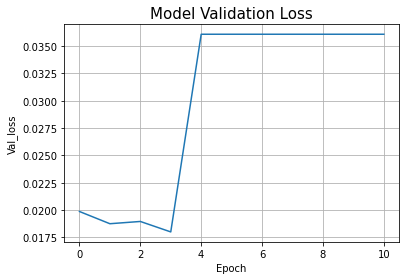

In [81]:
plt.title('Model Validation Loss', size='15')
plt.xlabel('Epoch')
plt.ylabel('Val_loss')
plt.grid(True)
plt.plot(history.history['val_loss'])
plt.savefig('./Result/Graph/Model_Valdation_Loss.png')
plt.show

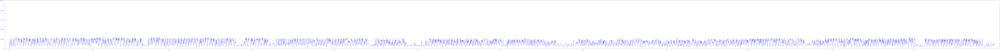

In [82]:
plt.figure(figsize=(300, 15))

plt.tick_params(axis='x', colors='blue', size=15)
plt.tick_params(axis='x', colors='blue', labelsize=12)
plt.tick_params(axis='y', colors='blue', size=15)
plt.tick_params(axis='y', colors='blue', labelsize=12)

plt.plot(pred, label = 'Prediction',color='blue')

plt.xticks([0, 31*24, 59*24, 90*24, 120*24, 151*24, 181*24, 212*24, 243*24, 273*24, 304*24, 334*24], 
           labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.yticks([0, 0.2, 0.4, 0.6, 0.8], labels=['0', '2000 W', '3500 W', '5500 W', '7000 W'])

plt.margins(x=0.005)
plt.savefig('./Result/Graph/Prediction.png')
plt.show()

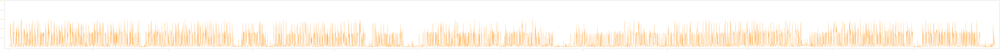

In [83]:
plt.figure(figsize=(300, 15))

plt.tick_params(axis='x', colors='darkorange', size=15)
plt.tick_params(axis='x', colors='darkorange', labelsize=12)
plt.tick_params(axis='y', colors='darkorange', size=15)
plt.tick_params(axis='y', colors='darkorange', labelsize=12)

plt.plot(y_test, label = 'Actual', color='darkorange')

plt.xticks([0, 31*24, 59*24, 90*24, 120*24, 151*24, 181*24, 212*24, 243*24, 273*24, 304*24, 334*24], 
           labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.yticks([0, 0.2, 0.4, 0.6, 0.8], labels=['0', '2000 W', '3500 W', '5500 W', '7000 W'])

plt.margins(x=0.005)
plt.savefig('./Result/Graph/Actual.png')
plt.show()

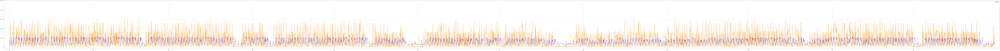

In [84]:
plt.figure(figsize=(300, 15))

plt.tick_params(axis='x', colors='black', size=15)
plt.tick_params(axis='x', colors='black', labelsize=12)
plt.tick_params(axis='y', colors='black', size=15)
plt.tick_params(axis='y', colors='black', labelsize=12)

plt.plot(pred, label = 'Prediction',color='blue')
plt.plot(y_test, label = 'Actual', color='darkorange')

plt.xticks([0, 31*24, 59*24, 90*24, 120*24, 151*24, 181*24, 212*24, 243*24, 273*24, 304*24, 334*24], 
           labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.yticks([0, 0.2, 0.4, 0.6, 0.8], labels=['0', '2000 W', '3500 W', '5500 W', '7000 W'])
plt.grid(True)
plt.legend()
plt.margins(x=0.005)
plt.savefig('./Result/Graph/Pred_with_Actual.png')
plt.show()

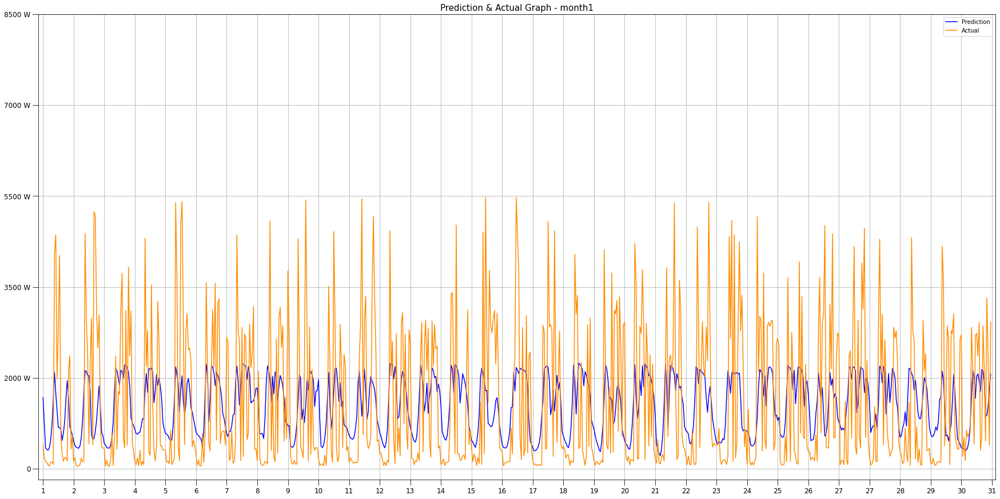

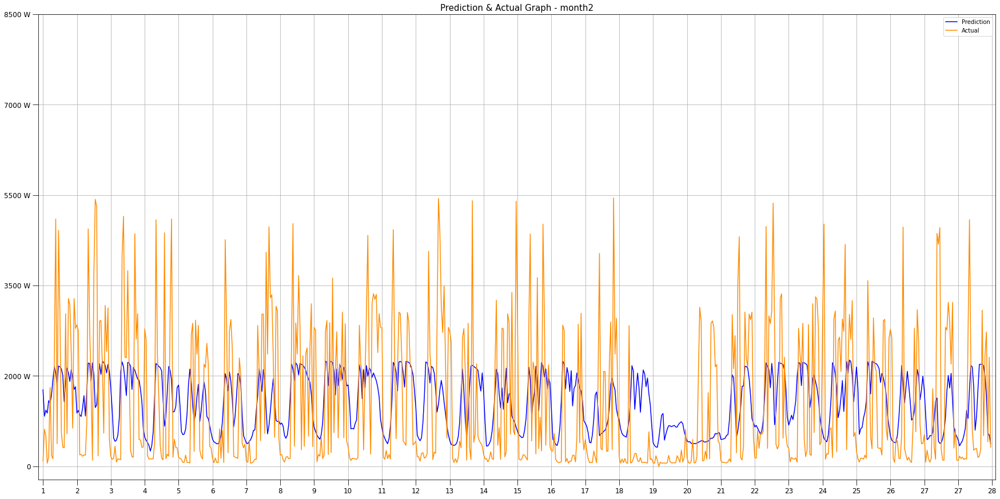

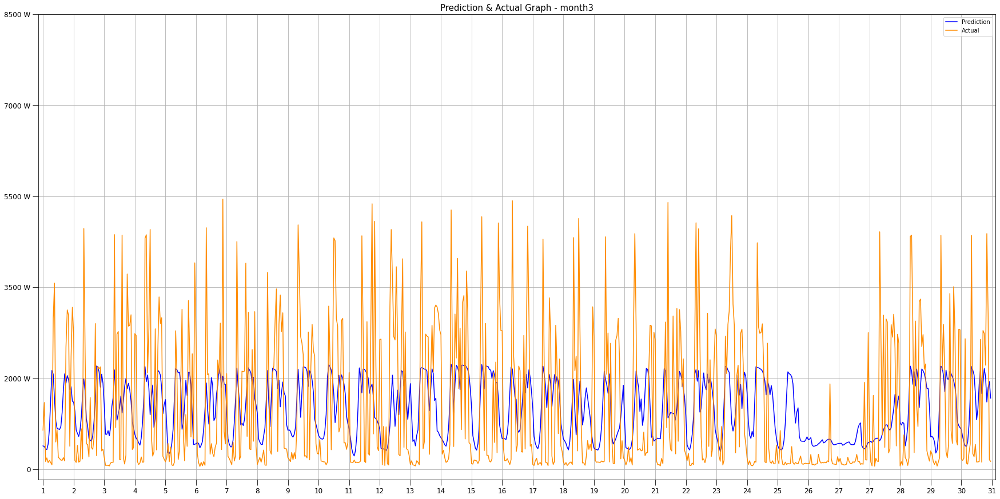

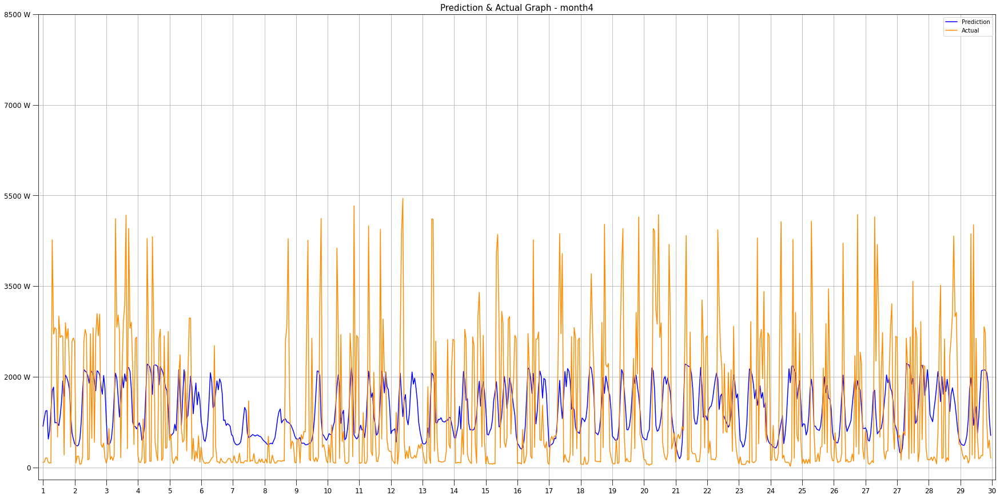

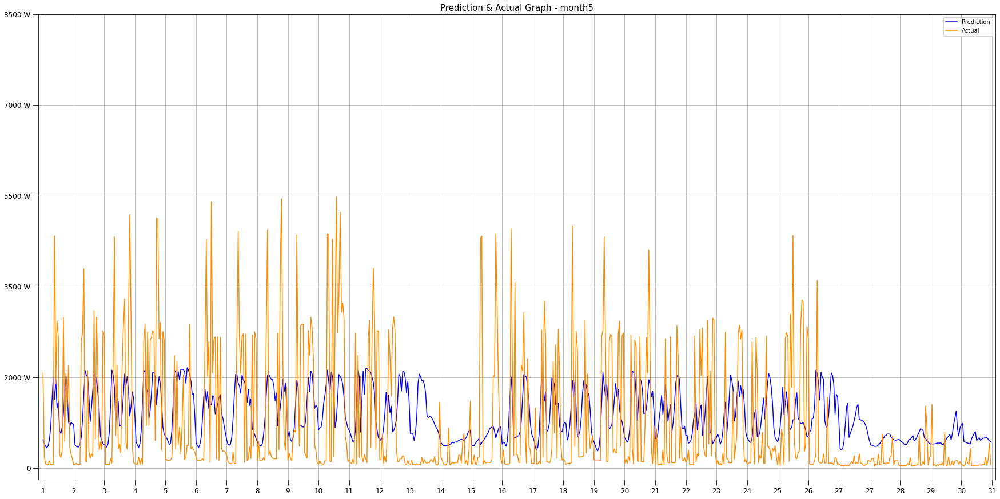

...

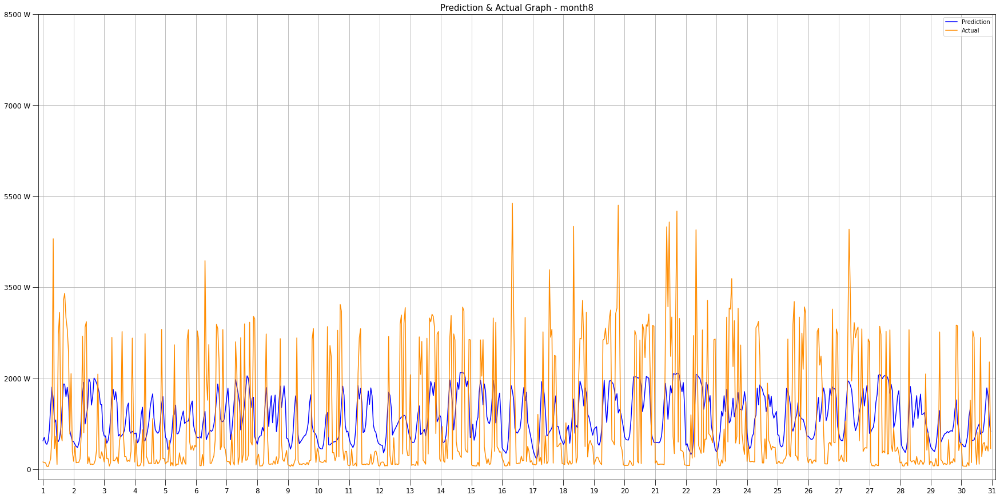

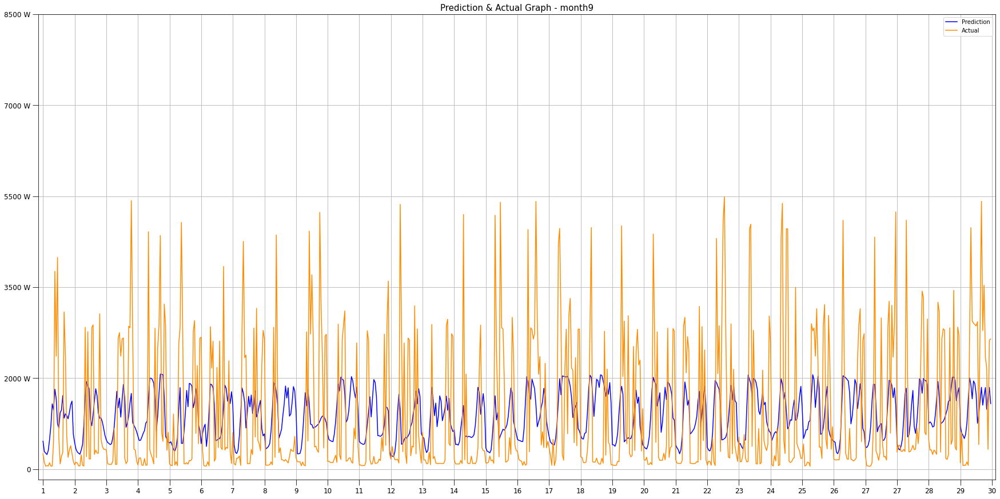

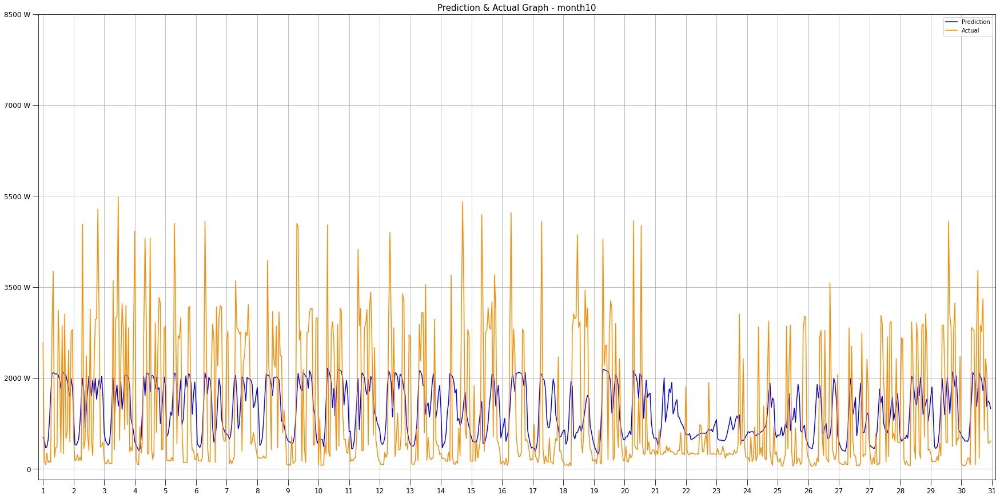

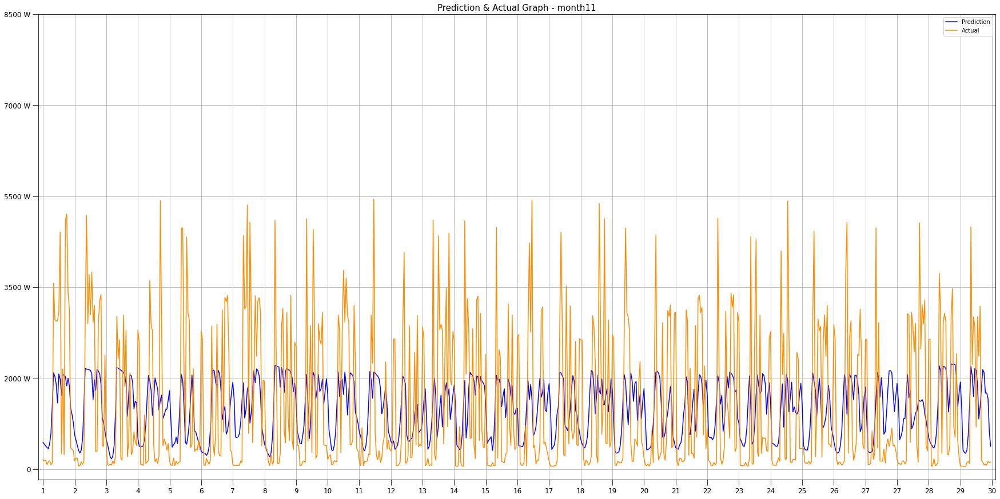

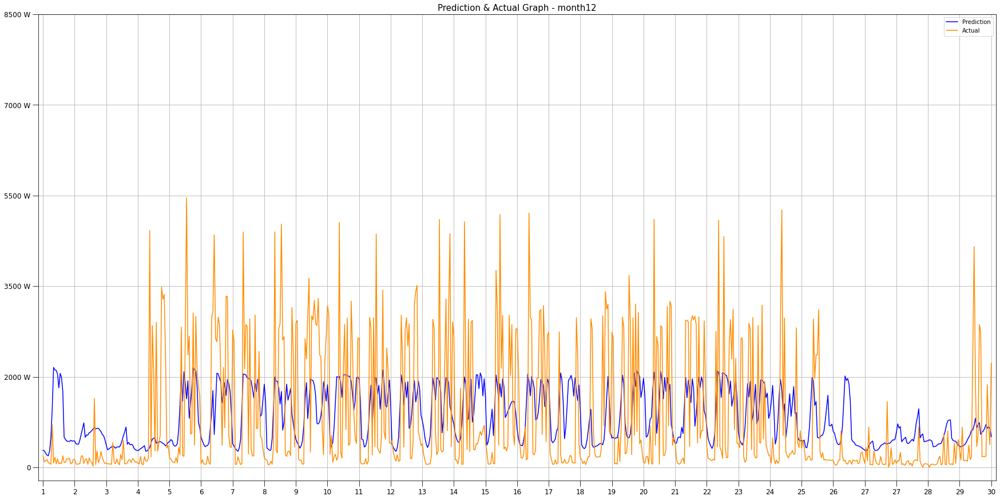

In [85]:
# 월 단위 그래프 분할 표시 및 저장
for m in range(1,13):
    month = {0:0, 1:31, 2:28, 3:31, 4:30, 5:31, 6:30, 7:31, 8:31, 9:30, 10:31, 11:30, 12:31}
    start = {1:0, 2:744, 3:1416, 4:2160, 5:2880, 6:3624, 7:4344, 8:5088, 9:5832, 10:6552, 11:7296, 12:8016}
    end = {1:744, 2:1416, 3:2160, 4:2880, 5:3624, 6:4344, 7:5088, 8:5832, 9:6552, 10:7296, 11:8016, 12:8760}
    
    plt.figure(figsize=(30, 15))
    
    plt.title('Prediction & Actual Graph - month'+str(m), size='15')
    
    plt.tick_params(axis='x', colors='black', size=10)
    plt.tick_params(axis='x', colors='black', labelsize=12)
    plt.tick_params(axis='y', colors='black', size=10)
    plt.tick_params(axis='y', colors='black', labelsize=12)
    
    plt.plot(pred[start[m]:end[m]], label = 'Prediction',color='blue', marker='.')
    plt.plot(y_test[start[m]:end[m]], label = 'Actual', color='darkorange', marker='.')
    
    xticks_list_28=[0, 24, 48, 72, 96, 120, 144, 168, 192, 216, 240, 264, 288, 312, 336, 360, 384, 408, 432, 456, 480, 504, 528, 552, 576, 600, 624, 648, 672]
    xticks_list_30=[0, 24, 48, 72, 96, 120, 144, 168, 192, 216, 240, 264, 288, 312, 336, 360, 384, 408, 432, 456, 480, 504, 528, 552, 576, 600, 624, 648, 672, 696, 720]
    xticks_list_31=[0, 24, 48, 72, 96, 120, 144, 168, 192, 216, 240, 264, 288, 312, 336, 360, 384, 408, 432, 456, 480, 504, 528, 552, 576, 600, 624, 648, 672, 696, 720, 744]
    
    if (m==1 or m==3 or m==5 or m==7 or m==8 or m==10 or m==12):
        plt.xticks(xticks_list_31, labels=['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12', '13', '14', '15', 
                                           '16', '17', '18', '19', '20', '21', '22', '23', '24', '25', '26', '27', '27', '28', '29', '30', '31'])
    if (m==4 or m==6  or m==9 or m==11):
        plt.xticks(xticks_list_30, labels=['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12', '13', '14', '15', 
                                           '16', '17', '18', '19', '20', '21', '22', '23', '24', '25', '26', '27', '27', '28', '29', '30'])
    if (m==2):
        plt.xticks(xticks_list_28, labels=['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12', '13', '14', '15', 
                                           '16', '17', '18', '19', '20', '21', '22', '23', '24', '25', '26', '27', '27', '28'])
        
    plt.yticks([0, 0.2, 0.4, 0.6, 0.8, 1.0], labels=['0', '2000 W', '3500 W', '5500 W', '7000 W', '8500 W'])
    
    plt.grid(True)
    plt.legend()
    plt.margins(x=0.005)
    plt.savefig('./Result/Graph/Prediction_with_Actual_'+str(m)+'.png') # 이름 각각!

#### 그래프 비교 결과

In [86]:
import cv2
from skimage.metrics import structural_similarity as ssim

In [87]:
# 유사도 측정을 위한 이미지 가공
image1 = cv2.imread('./Result/Graph/Prediction.png')
image2 = cv2.imread('./Result/Graph/Actual.png')

tempDiff1 = cv2.subtract(image1, image2)

gray1 = cv2.cvtColor(image1, cv2.COLOR_BGR2GRAY)
gray2 = cv2.cvtColor(image2, cv2.COLOR_BGR2GRAY)

In [88]:
# 차이 추출을 위한 뺄셈 과정
pred_list=pred.tolist()
actual_list=y_test.tolist()

result_numbers=[]
for minus in range(len(pred_list)):
    result = abs(float(pred_list[minus][0]) - float(actual_list[minus][0]))
    result_numbers.append(result)

In [89]:
(score, diff) = ssim(gray1, gray2, full=True)
sim_score = round(score,5)*100
result_num_total = round(sum(result_numbers),3)
final_score = (len(result_numbers) - result_num_total)/len(result_numbers)*100

print('그래프 유사도 ==>> %.3f %%\n' %sim_score)
print('예측차 판별도 ==>> %.3f %%' %final_score)

그래프 유사도 ==>> 85.497 %

예측차 판별도 ==>> 89.003 %


#### 성능 측정 지표

In [90]:
from sklearn.metrics import r2_score as r2
from sklearn.metrics import mean_absolute_error as MAE
from sklearn.metrics import mean_squared_error as MSE
from sklearn.metrics import mean_squared_log_error as MSLE

print('r2 >> %.4f' %r2(y_test, pred)) # 1에 가까워야 좋음
print('MAE >> %.4f' %MAE(y_test, pred)) # 0에 가까워야 좋음
print('MSE >> %.4f' %MSE(y_test, pred)) # 0에 가까워야 좋음
print('RMSE >> %.4f' %np.sqrt(MSE(y_test, pred))) # 0에 가까워야 좋음
print('RMSLE >> %.4f' %np.sqrt(MSLE(y_test, pred))) # 0에 가까워야 좋음

r2 >> 0.1511
MAE >> 0.1100
MSE >> 0.0186
RMSE >> 0.1363
RMSLE >> 0.1138


### 10. 예측값과 실제값 결과 csv 파일 저장

#### 1년 단위 데이터 저장

In [59]:
# 날짜 정보 생성
month = {1:31, 2:28, 3:31, 4:30, 5:31, 6:30, 7:31, 8:31, 9:30, 10:31, 11:30, 12:31}
datetime_list=[]

for m in range(1, 13):
    month = {1:31, 2:28, 3:31, 4:30, 5:31, 6:30, 7:31, 8:31, 9:30, 10:31, 11:30, 12:31}
    for d in range(month[m]):
        d=d+1
        m=int(m)
        d=int(d)
        
        if m<=9:
            m='0'+str(m)
        if d<=9:
            d='0'+str(d)
            
        for h in range(1,25):
            elem = '2016'+'년-'+str(m)+'월-'+str(d)+'일-'+str(h)+'시'
            datetime_list.append(elem)

In [60]:
# 넘파이 어레이를 데이터 프레임으로 변환
pred_df = pd.DataFrame(pred)
actual_df = pd.DataFrame(y_test)

In [61]:
df_for_chart = pd.DataFrame(columns=['datetime', 'pred', 'actual'])
df_for_chart['datetime']=datetime_list
df_for_chart['pred']=pred_df
df_for_chart['actual']=actual_df
df_for_chart.to_csv("./Result/Data/Electric_Prediction_result_data_for_Chart_Year.csv", encoding='cp949')

print('Job Done!!')

Job Done!!


#### 1달 단위 데이터 저장

In [62]:
pred_list=pred_df[0].values.tolist()
actual_list=actual_df[0].values.tolist()

for m in range(1,13):
    month = {0:0, 1:31, 2:28, 3:31, 4:30, 5:31, 6:30, 7:31, 8:31, 9:30, 10:31, 11:30, 12:31}
    start = {1:0, 2:744, 3:1416, 4:2160, 5:2880, 6:3624, 7:4344, 8:5088, 9:5832, 10:6552, 11:7296, 12:8016}
    end = {1:744, 2:1416, 3:2160, 4:2880, 5:3624, 6:4344, 7:5088, 8:5832, 9:6552, 10:7296, 11:8016, 12:8760}
    
    df_for_chart = pd.DataFrame(columns=['datetime', 'pred', 'actual'])
    df_for_chart['datetime']=datetime_list[start[m]:end[m]]
    df_for_chart['pred']=pred_list[start[m]:end[m]]
    df_for_chart['actual']=actual_list[start[m]:end[m]]
    
    df_for_chart.to_csv("./Result/Data/Electric_Prediction_result_data_for_Chart_"+str(m)+".csv", encoding='cp949')
    
print('Job Done!!')

Job Done!!


#### 일주일 단위 데이터 저장

In [63]:
try:
    os.mkdir('./Result/Data/Week')
    print('폴더 생성 완료.')
    
except FileExistsError:
    print('해당 폴더가 이미 존재합니다.')

해당 폴더가 이미 존재합니다.


In [64]:
pred_list=pred_df[0].values.tolist()
actual_list=actual_df[0].values.tolist()

count=0
for w in range(0, 8760-168, 168):
    count+=1
    start=w
    end=w+168
    
    df_for_chart = pd.DataFrame(columns=['datetime', 'pred', 'actual'])
    df_for_chart['datetime']=datetime_list[start:end]
    df_for_chart['pred']=pred_list[start:end]
    df_for_chart['actual']=actual_list[start:end]
    
    df_for_chart.to_csv("./Result/Data//Week/Electric_Prediction_result_data_for_Chart_week"+str(count)+".csv", encoding='cp949')
    
print('Job Done!!')

Job Done!!
